# **Imports**

In [ ]:
#   SETUP & IMPORTS
!pip install -q datasets transformers torch Pillow nltk scikit-learn seaborn
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from datasets import load_dataset
from PIL import Image
import io
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from transformers import BlipProcessor, BlipForConditionalGeneration
import nltk
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
import json
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')
from google.colab import drive
import os
from collections import Counter
import matplotlib.pyplot as plt
import random
from tqdm import tqdm

nltk.download('punkt')
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

Device: cuda


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


#**Data Loading & Preprocessing**

In [ ]:
# Model processor
processor = BlipProcessor.from_pretrained(
    "Salesforce/blip-image-captioning-base"
)

print("BLIP Processor loaded")

BLIP Processor loaded


In [ ]:
# Dataset Loading
dataset = load_dataset("umairhassan02/coco-captions-subset-59k", split="train[:10000]")
dataset = dataset.shuffle(seed=42)
df = dataset.to_pandas()


Resolving data files:   0%|          | 0/20 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/20 [00:00<?, ?it/s]

In [ ]:
# Image convert
def bytes_to_pil(img):
    return Image.open(io.BytesIO(img["bytes"])).convert("RGB") if img else None

df["image"] = df["image"].apply(bytes_to_pil)
df.dropna(subset=["image"], inplace=True)
df.reset_index(drop=True, inplace=True)

print(f"Final dataset size: {len(df)}\n")

In [ ]:
# Extracting 5 captions
def extract_all_captions(ann):
    if isinstance(ann, dict) and "caption" in ann:
        return ann["caption"]
    return []

df["captions"] = df["annotations"].apply(extract_all_captions)

df = df[df["captions"].map(len) > 0].reset_index(drop=True)

print(df.columns)
print(df["captions"].iloc[0])


In [ ]:
# Data  Split
train_df, temp_df = train_test_split(df, test_size=0.30, random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.50, random_state=42)
print(f"Train: {len(train_df)} | Val: {len(val_df)} | Test: {len(test_df)}")

In [ ]:
# Random caption selection
class CaptionDataset(Dataset):
    def __init__(self, df, processor, max_length=50):
        self.df = df
        self.processor = processor
        self.max_length = max_length

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        image = self.df.iloc[idx]["image"]
        captions = self.df.iloc[idx]["captions"]
        caption = random.choice(captions)

        encoding = self.processor(
            images=image,
            text=caption,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_tensors="pt"
        )

        return {k: v.squeeze(0) for k, v in encoding.items()}


# **Data exploration: Analysis & Visualization**

In [ ]:
# Dataset Analysis
caption_lengths = df["captions"].explode().apply(lambda x: len(x.split()))

print(f"Number of images : {len(df)}")
print(f"Total captions  : {len(caption_lengths)}")
print(f"Average caption length : {caption_lengths.mean():.2f} words")
print(f"Min length : {caption_lengths.min()} words")
print(f"Max length : {caption_lengths.max()} words")
print(f"Std deviation : {caption_lengths.std():.2f}")

Number of images : 10000
Total captions  : 50034
Average caption length : 10.48 words
Min length : 6 words
Max length : 48 words
Std deviation : 2.41


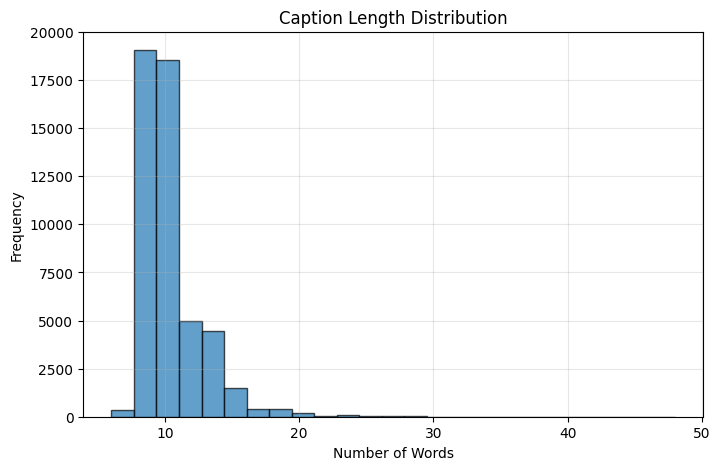

In [ ]:
# Plot 1: Caption Length Distribution
plt.figure(figsize=(8,5))
plt.hist(caption_lengths, bins=25, edgecolor='black', alpha=0.7)
plt.title("Caption Length Distribution")
plt.xlabel("Number of Words")
plt.ylabel("Frequency")
plt.grid(True, alpha=0.3)
plt.show()


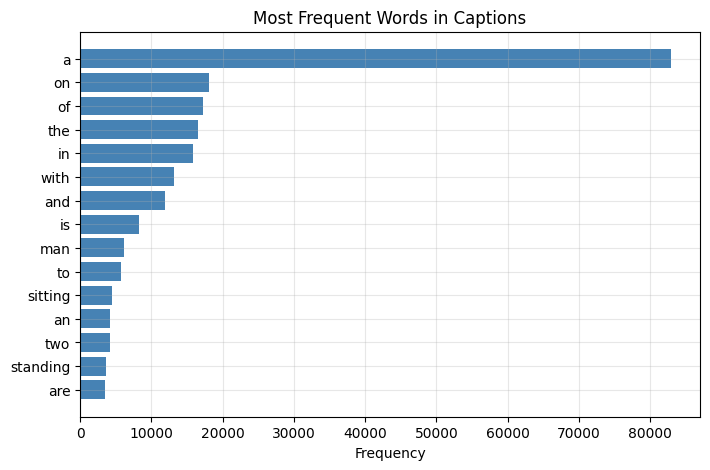

In [ ]:
# Plot 2: Most of Common Words

all_words = []

for caption in df["captions"].explode():
    all_words.extend(caption.lower().split())

word_freq = Counter(all_words)
common_words = word_freq.most_common(15)

words, counts = zip(*common_words)

plt.figure(figsize=(8,5))
plt.barh(words, counts, color='steelblue')
plt.title("Most Frequent Words in Captions")
plt.xlabel("Frequency")
plt.grid(True, alpha=0.3)
plt.gca().invert_yaxis()
plt.show()


 Example Images with Random Captions:


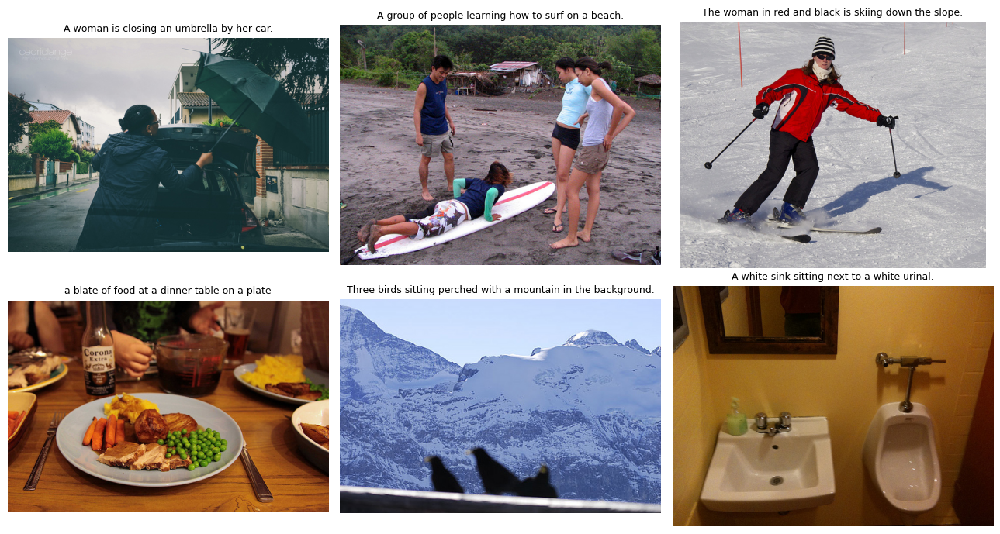

In [ ]:
# Plot 3: Sample Images
print("\n Example Images with Random Captions:")
fig, axes = plt.subplots(2, 3, figsize=(13, 7))
axes = axes.flatten()

for i in range(6):
    img = df.iloc[i]["image"]
    cap = np.random.choice(df.iloc[i]["captions"])
    axes[i].imshow(img)
    axes[i].set_title(cap, fontsize=9)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# Caption Length Statistics
def check_split_balance(train_df, val_df, test_df):

    def get_length_stats(df):
        # Analyze all captions (5 per image)
        lengths = df["captions"].explode().apply(lambda x: len(x.split()))
        return {
            'mean': lengths.mean(),
            'std': lengths.std(),
            'min': lengths.min(),
            'max': lengths.max()
        }

    train_stats = get_length_stats(train_df)
    val_stats   = get_length_stats(val_df)
    test_stats  = get_length_stats(test_df)

    print("\n Caption Length Statistics (All Captions):")
    print(f"{'Split':<10} {'Mean':<10} {'Std':<10} {'Min':<10} {'Max':<10}")
    print("-" * 55)
    print(f"{'Train':<10} {train_stats['mean']:<10.2f} {train_stats['std']:<10.2f} "
          f"{train_stats['min']:<10} {train_stats['max']:<10}")
    print(f"{'Val':<10} {val_stats['mean']:<10.2f} {val_stats['std']:<10.2f} "
          f"{val_stats['min']:<10} {val_stats['max']:<10}")
    print(f"{'Test':<10} {test_stats['mean']:<10.2f} {test_stats['std']:<10.2f} "
          f"{test_stats['min']:<10} {test_stats['max']:<10}")

    mean_diff = abs(train_stats['mean'] - val_stats['mean']) / train_stats['mean']
    if mean_diff > 0.1:
        print(f" Warning: Significant difference in caption lengths ({mean_diff*100:.1f}%)")
    else:
        print(" Caption lengths are well balanced across splits")

check_split_balance(train_df, val_df, test_df)


 Caption Length Statistics (All Captions):
Split      Mean       Std        Min        Max       
-------------------------------------------------------
Train      10.48      2.42       6          48        
Val        10.49      2.42       7          38        
Test       10.46      2.37       6          42        
 Caption lengths are well balanced across splits


# **Evaluation functions**

In [ ]:
# Caption Generation Function
def generate_caption(image, model, processor, max_length=50, num_beams=3):
    model.eval()
    inputs = processor(
        images=image,
        return_tensors="pt"
    ).to(next(model.parameters()).device)

    with torch.no_grad():
        out = model.generate(
            **inputs,
            max_length=max_length,
            num_beams=num_beams
        )

    return processor.decode(out[0], skip_special_tokens=True)

In [ ]:
# Evaluation Function
def evaluate_multi_ref(model, df):
    b1, b2, b3, b4 = [], [], [], []

    model.eval()

    for i in range(len(df)):
        image = df.iloc[i]["image"]
        refs = df.iloc[i]["captions"]

        hyp = generate_caption(image, model, processor)

        x1, x2, x3, x4 = compute_bleu_multi_refs(refs, hyp)

        b1.append(x1)
        b2.append(x2)
        b3.append(x3)
        b4.append(x4)

    return np.mean(b1), np.mean(b2), np.mean(b3), np.mean(b4)


In [ ]:
# BLEU Evaluation Function
smooth = SmoothingFunction().method1

def compute_bleu_multi_refs(refs, hyp):
    """
    refs: list of reference captions (strings)
    hyp : generated caption (string)
    """

    refs_tokens = [r.lower().split() for r in refs]
    hyp_tokens  = hyp.lower().split()

    bleu1 = sentence_bleu(
        refs_tokens, hyp_tokens,
        weights=(1, 0, 0, 0),
        smoothing_function=smooth
    )

    bleu2 = sentence_bleu(
        refs_tokens, hyp_tokens,
        weights=(0.5, 0.5, 0, 0),
        smoothing_function=smooth
    )

    bleu3 = sentence_bleu(
        refs_tokens, hyp_tokens,
        weights=(1/3, 1/3, 1/3, 0),
        smoothing_function=smooth
    )

    bleu4 = sentence_bleu(
        refs_tokens, hyp_tokens,
        weights=(0.25, 0.25, 0.25, 0.25),
        smoothing_function=smooth
    )

    return bleu1, bleu2, bleu3, bleu4


# **Choosing the Best Learning Rate**

In [ ]:
# =============================================
# Learning Rate Sensitivity Study (Fine-Tuning)
# =============================================

print("\n" + "="*70)
print(" Learning Rate Sensitivity Study for BLIP Fine-Tuning")
print("="*70)
print("Motivation:")
print("- Learning rate strongly affects convergence and generalization")
print("- We empirically evaluate multiple LR values instead of fixing one")
print("References:")
print("- Li et al., 2022 (BLIP)")
print("- Howard & Ruder, 2018 (ULMFiT)")
print("="*70)

# Candidate learning rates (small values recommended for partial fine-tuning)
learning_rates = [1e-5, 3e-5, 5e-5]

# Short training for comparison (not full convergence)
LR_SEARCH_EPOCHS = 3

lr_results = []

best_bleu4 = -1
best_lr = None

for lr in learning_rates:
    print(f"\nTesting Learning Rate = {lr:.1e}")

    # Load fresh BLIP model
    model_lr = BlipForConditionalGeneration.from_pretrained(
        "Salesforce/blip-image-captioning-base"
    ).to(device)

    # Freeze all parameters
    for p in model_lr.parameters():
        p.requires_grad = False

    # Unfreeze LM head only (same strategy as main fine-tuning)
    for name, p in model_lr.named_parameters():
        if "lm_head" in name or "text_decoder.cls" in name:
            p.requires_grad = True

    optimizer = torch.optim.AdamW(
        filter(lambda p: p.requires_grad, model_lr.parameters()),
        lr=lr,
        weight_decay=0.01
    )

    # -------- Short Training Loop --------
    for epoch in range(LR_SEARCH_EPOCHS):
        model_lr.train()
        total_loss = 0

        for batch in train_loader:
            batch = {k: v.to(device) for k, v in batch.items()}
            outputs = model_lr(**batch, labels=batch["input_ids"])
            loss = outputs.loss

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_loss += loss.item()

        avg_loss = total_loss / len(train_loader)
        print(f" Epoch {epoch+1}/{LR_SEARCH_EPOCHS} | Train Loss: {avg_loss:.4f}")

    # -------- Validation Evaluation --------
    b1, b2, b3, b4 = evaluate_multi_ref(model_lr, val_df)

    print(
        f" Validation BLEU | "
        f"B1={b1:.4f} | B2={b2:.4f} | B3={b3:.4f} | B4={b4:.4f}"
    )

    lr_results.append({
        "lr": lr,
        "bleu1": b1,
        "bleu2": b2,
        "bleu3": b3,
        "bleu4": b4
    })

    if b4 > best_bleu4:
        best_bleu4 = b4
        best_lr = lr
        print("  -> Best LR so far")

print("\n" + "="*60)
print(f" Selected Learning Rate for Final Fine-Tuning: {best_lr:.1e}")
print("="*60)



 Learning Rate Sensitivity Study for BLIP Fine-Tuning
Motivation:
- Learning rate strongly affects convergence and generalization
- We empirically evaluate multiple LR values instead of fixing one
References:
- Li et al., 2022 (BLIP)
- Howard & Ruder, 2018 (ULMFiT)

Testing Learning Rate = 1.0e-05
 Epoch 1/3 | Train Loss: 7.3715
 Epoch 2/3 | Train Loss: 6.7526
 Epoch 3/3 | Train Loss: 6.6074
 Validation BLEU | B1=0.7174 | B2=0.5549 | B3=0.4044 | B4=0.2916
  -> Best LR so far

Testing Learning Rate = 3.0e-05
 Epoch 1/3 | Train Loss: 6.9253
 Epoch 2/3 | Train Loss: 6.5060
 Epoch 3/3 | Train Loss: 6.3477
 Validation BLEU | B1=0.7174 | B2=0.5510 | B3=0.4012 | B4=0.2869

Testing Learning Rate = 5.0e-05
 Epoch 1/3 | Train Loss: 6.7604
 Epoch 2/3 | Train Loss: 6.3522
 Epoch 3/3 | Train Loss: 6.0916
 Validation BLEU | B1=0.7172 | B2=0.5523 | B3=0.4026 | B4=0.2903

 Selected Learning Rate for Final Fine-Tuning: 1.0e-05


# **Pre-Trained model evaluation**

In [ ]:
# Pre-Trained Model Evaluation (with no trainig)
print("=" * 70)
print("BASELINE: Pretrained BLIP (TEST SET, Multi-Reference BLEU)")
print("=" * 70)

pretrained_model = BlipForConditionalGeneration.from_pretrained(
    "Salesforce/blip-image-captioning-base"
).to(device)

print("✓ Pretrained BLIP loaded")

print("\n🔍 Evaluating Pretrained BLIP on TEST SET (1500 images)")

b1_pre, b2_pre, b3_pre, b4_pre = evaluate_multi_ref(
    pretrained_model,
    test_df
)

print("\n📊 Pretrained BLIP – Test BLEU Scores:")
print(f"BLEU-1: {b1_pre:.4f}")
print(f"BLEU-2: {b2_pre:.4f}")
print(f"BLEU-3: {b3_pre:.4f}")
print(f"BLEU-4: {b4_pre:.4f}")


BASELINE: Pretrained BLIP (TEST SET, Multi-Reference BLEU)
✓ Pretrained BLIP loaded

🔍 Evaluating Pretrained BLIP on TEST SET (1500 images)

📊 Pretrained BLIP – Test BLEU Scores:
BLEU-1: 0.6366
BLEU-2: 0.4989
BLEU-3: 0.3708
BLEU-4: 0.2752


# **Fine-tuning The BLIP Model**

In [ ]:
# Load model
model = BlipForConditionalGeneration.from_pretrained(
    "Salesforce/blip-image-captioning-base"
).to(device)
print("BLIP model loaded on:", device)

config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

BLIP model loaded on: cuda


In [ ]:
# Freeze all layers
for param in model.parameters():
    param.requires_grad = False

# Unfreeze only LM Head
for name, param in model.named_parameters():
    if "lm_head" in name or "text_decoder.cls" in name:
        param.requires_grad = True

print("✓ LM Head unfrozen (trainable)")


✓ LM Head unfrozen (trainable)


In [ ]:
# Data Loaders

MAX_LENGTH = 50
BATCH_SIZE = 4

train_dataset = CaptionDataset(train_df, processor, max_length=MAX_LENGTH)
val_dataset   = CaptionDataset(val_df, processor, max_length=MAX_LENGTH)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader   = DataLoader(val_dataset, batch_size=BATCH_SIZE)

print("Train loader size:", len(train_loader))
print("Val loader size:", len(val_loader))


Train loader size: 1750
Val loader size: 375


In [ ]:
# Optimizer: AdamW
LEARNING_RATE = 1e-5
EPOCHS = 20

optimizer = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=LEARNING_RATE,
    weight_decay=0.01
)

print("Optimizer: AdamW")
print("Learning Rate:", LEARNING_RATE)

Optimizer: AdamW
Learning Rate: 1e-05


In [ ]:
# Model Training
import random

drive.mount('/content/drive')

CHECKPOINT_DIR = "/content/drive/MyDrive/DeepLearning/finalcheckpoints"
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

print("Checkpoint directory:", CHECKPOINT_DIR)

train_losses = []
val_losses = []

print("\nStarting Baseline Fine-Tuning with Checkpoints...\n")

for epoch in range(EPOCHS):
    model.train()
    total_train_loss = 0

    for batch in train_loader:
        batch = {k: v.to(device) for k, v in batch.items()}

        outputs = model(**batch,  labels=batch["input_ids"])
        loss = outputs.loss

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_train_loss += loss.item()

    avg_train_loss = total_train_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    # Validation
    model.eval()
    total_val_loss = 0

    with torch.no_grad():
        for batch in val_loader:
            batch = {k: v.to(device) for k, v in batch.items()}
            outputs = model(**batch, labels=batch["input_ids"])
            total_val_loss += outputs.loss.item()

    avg_val_loss = total_val_loss / len(val_loader)
    val_losses.append(avg_val_loss)

    print(
        f"Epoch {epoch+1}/{EPOCHS} | "
        f"Train Loss: {avg_train_loss:.4f} | "
        f"Val Loss: {avg_val_loss:.4f}"
    )

    # Save checkpoint
    checkpoint_path = f"{CHECKPOINT_DIR}/blip_baseline_epoch_{epoch+1}.pth"
    torch.save(model.state_dict(), checkpoint_path)
    print(f"💾 Saved checkpoint: {checkpoint_path}")

print("\nBaseline fine-tuning completed!")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Checkpoint directory: /content/drive/MyDrive/DeepLearning/finalcheckpoints

Starting Baseline Fine-Tuning with Checkpoints...

Epoch 1/20 | Train Loss: 7.3716 | Val Loss: 6.8717
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/finalcheckpoints/blip_baseline_epoch_1.pth
Epoch 2/20 | Train Loss: 6.7519 | Val Loss: 6.6719
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/finalcheckpoints/blip_baseline_epoch_2.pth
Epoch 3/20 | Train Loss: 6.6162 | Val Loss: 6.5877
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/finalcheckpoints/blip_baseline_epoch_3.pth
Epoch 4/20 | Train Loss: 6.5483 | Val Loss: 6.5214
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/finalcheckpoints/blip_baseline_epoch_4.pth
Epoch 5/20 | Train Loss: 6.4828 | Val Loss: 6.4774
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/finalcheckpoints/blip_baseline_epoch_

In [ ]:
drive.mount('/content/drive')

save_path = "/content/drive/MyDrive/DeepLearning/Final_blip_baseline_model.pth"
torch.save(model.state_dict(), save_path)
print("Model saved to:", save_path)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Model saved to: /content/drive/MyDrive/DeepLearning/Final_blip_baseline_model.pth


## **Loss Comparison**

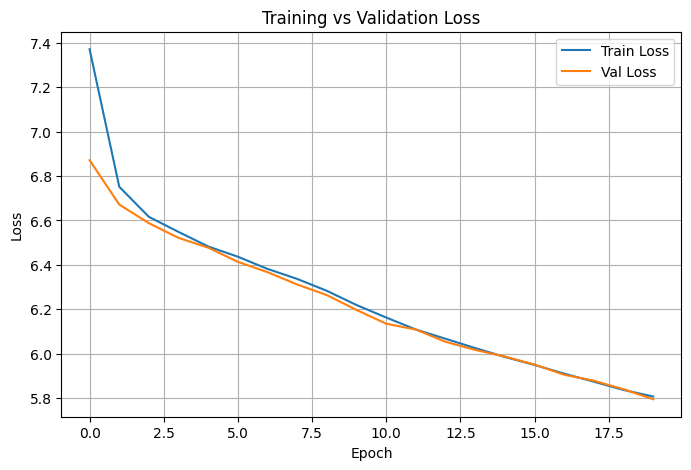

In [ ]:
plt.figure(figsize=(8, 5))
plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Val Loss")

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss")
plt.legend()
plt.grid(True)
plt.show()


## **BLEU Comparison**

In [ ]:
b1_finetune, b2_finetune, b3_finetune, b4_finetune = evaluate_multi_ref(
    model,
    test_df
)

print("\n📊 Fine-Tuned BLIP – Test BLEU Scores:")
print(f"BLEU-1: {b1_finetune:.4f}")
print(f"BLEU-2: {b2_finetune:.4f}")
print(f"BLEU-3: {b3_finetune:.4f}")
print(f"BLEU-4: {b4_finetune:.4f}")


📊 Fine-Tuned BLIP – Test BLEU Scores:
BLEU-1: 0.7276
BLEU-2: 0.5633
BLEU-3: 0.4106
BLEU-4: 0.2960


# **Improvements**

##  **Optimization Improvements**
We replace AdamW optimizer with alternative strategies and compare their performance:


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
# ============================================
# DataLoaders for Optimization Improvements
# (Multi-Caption Training)
# ============================================

train_loader_mr = DataLoader(
    CaptionDataset(train_df, processor, max_length=MAX_LENGTH),
    batch_size=8,
    shuffle=True
)

val_loader_mr = DataLoader(
    CaptionDataset(val_df, processor, max_length=MAX_LENGTH),
    batch_size=BATCH_SIZE,
    shuffle=False
)

print("✓ Multi-Reference DataLoaders created for Improvements")
print("Train MR loader:", len(train_loader_mr))
print("Val MR loader:", len(val_loader_mr))


✓ Multi-Reference DataLoaders created for Improvements
Train MR loader: 875
Val MR loader: 375


#### **1- Optimizer: SGD Optimizer**

In [ ]:

# IMPROVEMENT 1: Optimization using SGD with Momentum

print("=" * 70)
print("IMPROVEMENT 1: SGD (on Fine-Tuned Model with Early Stopping)")
print("=" * 70)

# Load the BLIP base architecture.
# The model structure remains identical to the baseline;
# only the optimization strategy will differ.
model_sgd = BlipForConditionalGeneration.from_pretrained(
    "Salesforce/blip-image-captioning-base"
).to(device)


# Load weights from the previously fine-tuned BLIP model.
# This ensures that optimization improvements are applied on top of the same fine-tuned baseline, not from scratch.

model_sgd.load_state_dict(
    torch.load(
        "/content/drive/MyDrive/DeepLearning/Final_blip_baseline_model.pth",
        map_location=device
    )
)

# Freeze all model parameters to preserve learned
# vision–language representations from pre-training
# and fine-tuning.
for p in model_sgd.parameters():
    p.requires_grad = False

# Unfreeze only language-specific layers:
# - lm_head: maps decoder features to vocabulary logits
# - text_decoder.cls: final classification layer
# This focuses training on caption generation without disturbing visual or cross-modal representations.
for name, p in model_sgd.named_parameters():
    if "lm_head" in name or "text_decoder.cls" in name:
        p.requires_grad = True

# Configure SGD optimizer with momentum.
# Momentum helps smooth gradient updates and reduces oscillations, which can improve convergence stability during sequence generation tasks.
optimizer = torch.optim.SGD(
    filter(lambda p: p.requires_grad, model_sgd.parameters()),
    lr=1e-5,
    momentum=0.9
)

# Training configuration:
# - Number of epochs kept consistent with baseline fine-tuning
# - Early stopping is used to prevent overfitting by monitoring
#   validation loss.
EPOCHS_IMP = 20
PATIENCE = 3

# Lists to track training and validation loss
# across epochs for later analysis and visualization.
train_loss_sgd = []
val_loss_sgd = []

best_val_loss = float("inf")
patience_counter = 0
best_model_state = None

# Training loop for SGD optimization.
# Each epoch consists of a training phase followed by a validation phase to monitor generalization.
for epoch in range(EPOCHS_IMP):

    # -------- Training --------

# Model parameters are updated using SGD with momentum
# based only on the unfrozen language layers.
    model_sgd.train()
    total_train_loss = 0

    for batch in train_loader_mr:
        batch = {k: v.to(device) for k, v in batch.items()}

        outputs = model_sgd(**batch, labels=batch["input_ids"])
        loss = outputs.loss

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_train_loss += loss.item()

    avg_train = total_train_loss / len(train_loader_mr)
    train_loss_sgd.append(avg_train)

    # -------- Validation --------
# Model performance is evaluated on the validation set
# without gradient updates to assess generalization.
    model_sgd.eval()
    total_val_loss = 0

    with torch.no_grad():
        for batch in val_loader_mr:
            batch = {k: v.to(device) for k, v in batch.items()}
            outputs = model_sgd(**batch, labels=batch["input_ids"])
            total_val_loss += outputs.loss.item()

    avg_val = total_val_loss / len(val_loader_mr)
    val_loss_sgd.append(avg_val)

    print(
        f"Epoch {epoch+1}/{EPOCHS_IMP} | "
        f"Train Loss: {avg_train:.4f} | "
        f"Val Loss: {avg_val:.4f}"
    )

    # -------- Early Stopping --------
# If validation loss improves, the model state is saved.
# Training stops when no improvement is observed for
# a predefined number of epochs (patience).
    if avg_val < best_val_loss:
        best_val_loss = avg_val
        best_model_state = model_sgd.state_dict()
        patience_counter = 0
        print("  -> New best validation loss")
    else:
        patience_counter += 1
        print(f"  -> No improvement ({patience_counter}/{PATIENCE})")

        if patience_counter >= PATIENCE:
            print("Early stopping triggered")
            break

# Load the best-performing model based on
# minimum validation loss achieved during training.
model_sgd.load_state_dict(best_model_state)




IMPROVEMENT 1: SGD (on Fine-Tuned Model with Early Stopping)
Epoch 1/20 | Train Loss: 5.7558 | Val Loss: 5.7454
  -> New best validation loss
Epoch 2/20 | Train Loss: 5.7103 | Val Loss: 5.7106
  -> New best validation loss
Epoch 3/20 | Train Loss: 5.6625 | Val Loss: 5.6646
  -> New best validation loss
Epoch 4/20 | Train Loss: 5.6061 | Val Loss: 5.6022
  -> New best validation loss
Epoch 5/20 | Train Loss: 5.5603 | Val Loss: 5.5542
  -> New best validation loss
Epoch 6/20 | Train Loss: 5.5080 | Val Loss: 5.5104
  -> New best validation loss
Epoch 7/20 | Train Loss: 5.4602 | Val Loss: 5.4548
  -> New best validation loss
Epoch 8/20 | Train Loss: 5.4099 | Val Loss: 5.4128
  -> New best validation loss
Epoch 9/20 | Train Loss: 5.3612 | Val Loss: 5.3575
  -> New best validation loss
Epoch 10/20 | Train Loss: 5.3095 | Val Loss: 5.3128
  -> New best validation loss
Epoch 11/20 | Train Loss: 5.2654 | Val Loss: 5.2616
  -> New best validation loss
Epoch 12/20 | Train Loss: 5.2148 | Val Loss: 5

<All keys matched successfully>

In [ ]:

# Final Evaluation on Test Set
# The optimized SGD model is evaluated on the unseen test set
# using multi-reference BLEU metrics (BLEU-1 to BLEU-4).
# This step measures how well the model generalizes to new data and allows direct comparison with the pretrained and fine-tuned baselines.

# Compute multi-reference BLEU scores.
# Multiple human-written captions per image are used as references, providing a more reliable evaluation of caption quality and linguistic variability.

b1_sgd, b2_sgd, b3_sgd, b4_sgd = evaluate_multi_ref(
    model_sgd,
    test_df
)

print("\nSGD Improvement – Test BLEU Scores:")
print(f"BLEU-1: {b1_sgd:.4f}")
print(f"BLEU-2: {b2_sgd:.4f}")
print(f"BLEU-3: {b3_sgd:.4f}")
print(f"BLEU-4: {b4_sgd:.4f}")

# Higher-order BLEU scores (BLEU-3 and BLEU-4) reflect improved sentence-level coherence and long-range dependency modeling in generated captions.


SGD Improvement – Test BLEU Scores:
BLEU-1: 0.7285
BLEU-2: 0.5649
BLEU-3: 0.4149
BLEU-4: 0.3007


#### **2- Optimizer: RMSprop Optimizer**

In [ ]:
# IMPROVEMENT 2: RMSprop Optimization
# This experiment evaluates RMSprop as an alternative optimizer applied on top of the fine-tuned BLIP model.
# All architectural components and trainable layers remain
# unchanged to ensure a fair comparison with SGD and AdamW.

print("=" * 70)
print("IMPROVEMENT 2: RMSprop (on Fine-Tuned Model)")
print("=" * 70)

# Load the BLIP base architecture.
# The same pretrained BLIP model is used to ensure that differences in performance are due only to the optimizer choice and not to model initialization.
model_rms = BlipForConditionalGeneration.from_pretrained(
    "Salesforce/blip-image-captioning-base"
).to(device)

# Load weights from the previously fine-tuned BLIP model.
# This confirms that optimization improvements are applied after fine-tuning, not from scratch, isolating the effect of the RMSprop optimizer.
model_rms.load_state_dict(
    torch.load(
        "/content/drive/MyDrive/DeepLearning/Final_blip_baseline_model.pth",
        map_location=device
    )
)

print("✓ Fine-tuned weights loaded")

# -------------------------------------------------
# Freeze all parameters
# -------------------------------------------------
for p in model_rms.parameters():
    p.requires_grad = False

# -------------------------------------------------
# Unfreeze only LM head (same as fine-tuning)
# -------------------------------------------------
for name, p in model_rms.named_parameters():
    if "lm_head" in name or "text_decoder.cls" in name:
        p.requires_grad = True

print("✓ LM Head is trainable")

# -------------------------------------------------
# Define RMSprop optimizer.
# RMSprop adapts learning rates based on a moving average of squared gradients, which is beneficial for handling non-stationary gradients in sequence generation tasks.
# -------------------------------------------------
optimizer = torch.optim.RMSprop(
    filter(lambda p: p.requires_grad, model_rms.parameters()),
    lr=1e-5,
    alpha=0.99
)

# -------------------------------------------------
# Training configuration
# Early stopping is enabled to prevent overfitting by monitoring validation loss.
# -------------------------------------------------
EPOCHS_IMP = 20
PATIENCE = 3

train_loss_rms = []
val_loss_rms = []

best_val_loss = float("inf")
patience_counter = 0
best_model_state = None

# -------------------------------------------------
# Training and validation loop
# Training loss measures optimization progress, while
# validation loss is used to assess generalization.
# -------------------------------------------------
for epoch in range(EPOCHS_IMP):

    # -------- Training --------
    model_rms.train()
    total_train_loss = 0

    for batch in train_loader_mr:
        batch = {k: v.to(device) for k, v in batch.items()}

        outputs = model_rms(**batch, labels=batch["input_ids"])
        loss = outputs.loss

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_train_loss += loss.item()

    avg_train_loss = total_train_loss / len(train_loader_mr)
    train_loss_rms.append(avg_train_loss)

    # -------- Validation --------
    model_rms.eval()
    total_val_loss = 0

    with torch.no_grad():
        for batch in val_loader_mr:
            batch = {k: v.to(device) for k, v in batch.items()}
            outputs = model_rms(**batch, labels=batch["input_ids"])
            total_val_loss += outputs.loss.item()

    avg_val_loss = total_val_loss / len(val_loader_mr)
    val_loss_rms.append(avg_val_loss)

    print(
        f"Epoch {epoch+1}/{EPOCHS_IMP} | "
        f"Train Loss: {avg_train_loss:.4f} | "
        f"Val Loss: {avg_val_loss:.4f}"
    )

    # -------- Early Stopping Logic --------
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        best_model_state = model_rms.state_dict()
        patience_counter = 0
        print("   ✓ Validation loss improved")
    else:
        patience_counter += 1
        print(f"   ✗ No improvement ({patience_counter}/{PATIENCE})")

        if patience_counter >= PATIENCE:
            print(" Early stopping triggered")
            model_rms.load_state_dict(best_model_state)
            break



IMPROVEMENT 2: RMSprop (on Fine-Tuned Model)
✓ Fine-tuned weights loaded
✓ LM Head is trainable
Epoch 1/20 | Train Loss: 5.7717 | Val Loss: 5.7929
   ✓ Validation loss improved
Epoch 2/20 | Train Loss: 5.7558 | Val Loss: 5.7753
   ✓ Validation loss improved
Epoch 3/20 | Train Loss: 5.7381 | Val Loss: 5.7409
   ✓ Validation loss improved
Epoch 4/20 | Train Loss: 5.7140 | Val Loss: 5.7320
   ✓ Validation loss improved
Epoch 5/20 | Train Loss: 5.7032 | Val Loss: 5.7172
   ✓ Validation loss improved
Epoch 6/20 | Train Loss: 5.6764 | Val Loss: 5.6842
   ✓ Validation loss improved
Epoch 7/20 | Train Loss: 5.6609 | Val Loss: 5.6795
   ✓ Validation loss improved
Epoch 8/20 | Train Loss: 5.6412 | Val Loss: 5.6642
   ✓ Validation loss improved
Epoch 9/20 | Train Loss: 5.6312 | Val Loss: 5.6449
   ✓ Validation loss improved
Epoch 10/20 | Train Loss: 5.6050 | Val Loss: 5.6333
   ✓ Validation loss improved
Epoch 11/20 | Train Loss: 5.5960 | Val Loss: 5.6088
   ✓ Validation loss improved
Epoch 12/20

In [ ]:
# -------------------------------------------------
# Final evaluation on TEST set (Multi-Reference BLEU)
# -------------------------------------------------
b1_rms, b2_rms, b3_rms, b4_rms = evaluate_multi_ref(
    model_rms,
    test_df
)

print("\n📊 RMSprop Improvement – Test BLEU Scores:")
print(f"BLEU-1: {b1_rms:.4f}")
print(f"BLEU-2: {b2_rms:.4f}")
print(f"BLEU-3: {b3_rms:.4f}")
print(f"BLEU-4: {b4_rms:.4f}")



📊 RMSprop Improvement – Test BLEU Scores:
BLEU-1: 0.7274
BLEU-2: 0.5636
BLEU-3: 0.4124
BLEU-4: 0.2971


### **Performance Comparison**

##### **Loss Comparison: SGD vs RMSprop**

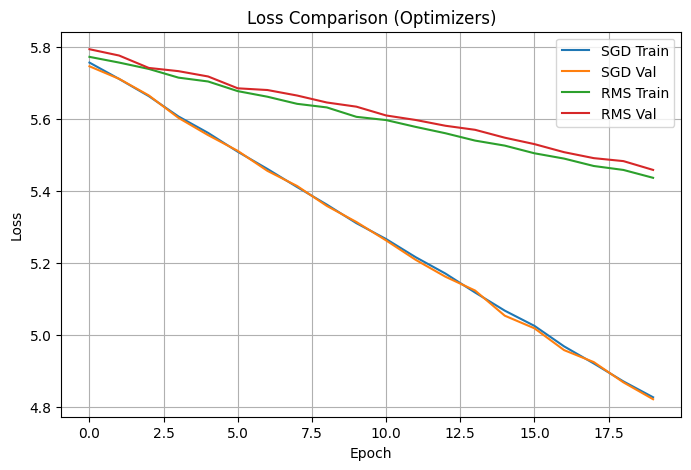

In [ ]:
plt.figure(figsize=(8,5))
plt.plot(train_loss_sgd, label="SGD Train")
plt.plot(val_loss_sgd, label="SGD Val")
plt.plot(train_loss_rms, label="RMS Train")
plt.plot(val_loss_rms, label="RMS Val")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Loss Comparison (Optimizers)")
plt.legend()
plt.grid()
plt.show()


#### **Output Comparison: SGD vs RMSprop vs Pretrained**

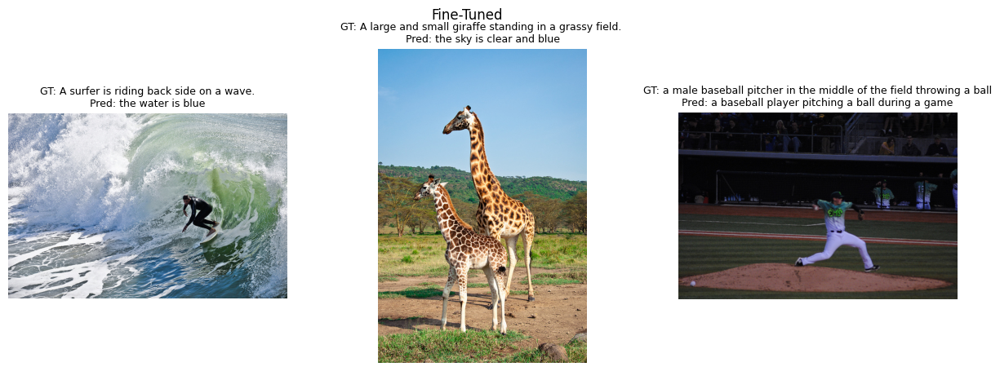

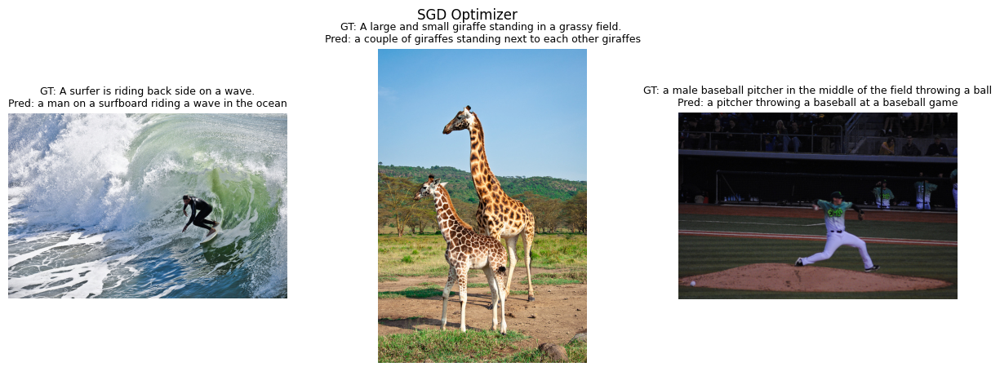

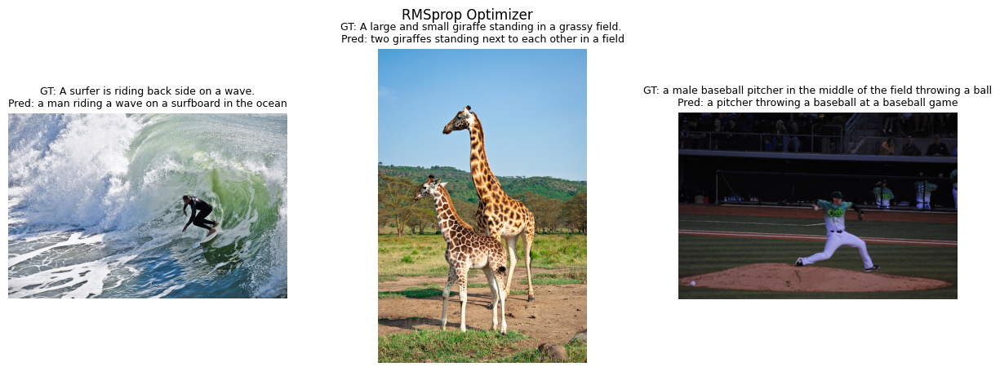

In [ ]:
def show_predictions(model, df, title):
    fig, axes = plt.subplots(1, 3, figsize=(15,5))
    for i in range(3):
        img = df.iloc[i]["image"]
        gt  = df.iloc[i]["captions"][0]
        pred = generate_caption(img, model, processor)

        axes[i].imshow(img)
        axes[i].set_title(f"GT: {gt}\nPred: {pred}", fontsize=9)
        axes[i].axis("off")
    plt.suptitle(title)
    plt.show()

show_predictions(model, test_df, "Fine-Tuned")
show_predictions(model_sgd, test_df, "SGD Optimizer")
show_predictions(model_rms, test_df, "RMSprop Optimizer")


#### **BLEU Comparison:Pretrained, Fine-Tuned, Improvement**

In [ ]:
b1_pre = 0.6366
b2_pre = 0.4989
b3_pre = 0.3708
b4_pre = 0.2752

b1_finetune = 0.7276
b2_finetune = 0.5633
b3_finetune = 0.4106
b4_finetune = 0.2960


b1_sgd = 0.7285
b2_sgd = 0.5649
b3_sgd = 0.4149
b4_sgd = 0.3007


b1_rms = 0.7274
b2_rms = 0.5636
b3_rms = 0.4124
b4_rms = 0.2971



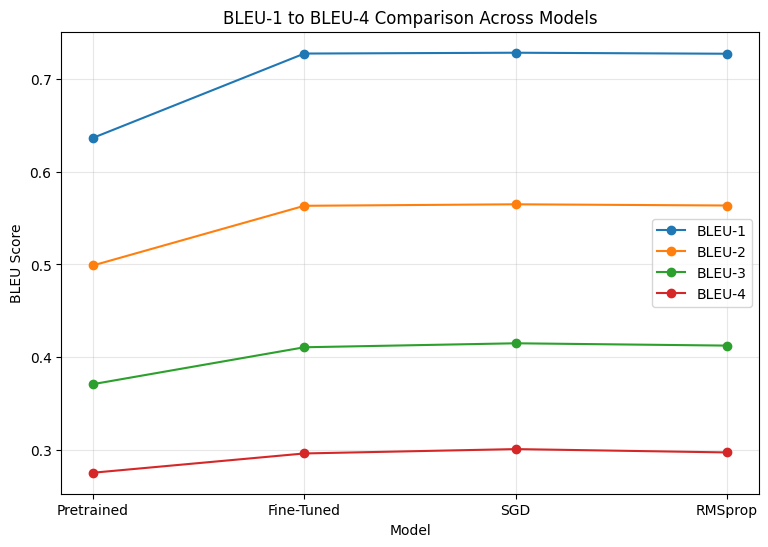

In [ ]:
models = ["Pretrained", "Fine-Tuned", "SGD", "RMSprop"]

bleu1 = [b1_pre, b1_finetune, b1_sgd, b1_rms]
bleu2 = [b2_pre, b2_finetune, b2_sgd, b2_rms]
bleu3 = [b3_pre, b3_finetune, b3_sgd, b3_rms]
bleu4 = [b4_pre, b4_finetune, b4_sgd, b4_rms]

plt.figure(figsize=(9,6))
plt.plot(models, bleu1, marker="o", label="BLEU-1")
plt.plot(models, bleu2, marker="o", label="BLEU-2")
plt.plot(models, bleu3, marker="o", label="BLEU-3")
plt.plot(models, bleu4, marker="o", label="BLEU-4")

plt.xlabel("Model")
plt.ylabel("BLEU Score")
plt.title("BLEU-1 to BLEU-4 Comparison Across Models")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()


## **Regluraztion Imporvment**

### **1- Label Smoothing**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# =========================================================
# IMPROVEMENT 3: LABEL SMOOTHING
# (Multi-Caption Training + Multi-Ref Evaluation)
# =========================================================

import os
import random
import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader
from transformers import BlipForConditionalGeneration

print("=" * 70)
print("IMPROVEMENT 3: Label Smoothing (Multi-Caption Training + Multi-Ref Evaluation)")
print("=" * 70)

# -------------------------------------------------
# (Optional) Debug: make CUDA errors show exact line
# -------------------------------------------------
# os.environ["CUDA_LAUNCH_BLOCKING"] = "1"

# -------------------------------------------------
# 1) Ensure DataLoaders exist (recreate to avoid NameError)
# -------------------------------------------------
MAX_LENGTH = 50
BATCH_SIZE = 4

train_dataset = CaptionDataset(train_df, processor, max_length=MAX_LENGTH)
val_dataset   = CaptionDataset(val_df, processor, max_length=MAX_LENGTH)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False)

print("Train loader size:", len(train_loader))
print("Val loader size:", len(val_loader))

# -------------------------------------------------
# 2) Load fine-tuned baseline model weights
# -------------------------------------------------
model_ls = BlipForConditionalGeneration.from_pretrained(
    "Salesforce/blip-image-captioning-base"
).to(device)

baseline_path = "/content/drive/MyDrive/Final_blip_baseline_model.pth"
model_ls.load_state_dict(torch.load(baseline_path, map_location=device))

print("✓ Fine-tuned weights loaded")

# -------------------------------------------------
# 3) Freeze all layers except LM head
# -------------------------------------------------
for p in model_ls.parameters():
    p.requires_grad = False

for name, p in model_ls.named_parameters():
    if "lm_head" in name or "text_decoder.cls" in name:
        p.requires_grad = True

print("✓ LM Head is trainable")

# -------------------------------------------------
# 4) Optimizer
# -------------------------------------------------
optimizer = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, model_ls.parameters()),
    lr=1e-5,
    weight_decay=0.01
)

print("✓ AdamW optimizer initialized")

# -------------------------------------------------
# 5) Label Smoothing Loss (SAFE VERSION avoids CUDA assert)
# -------------------------------------------------
EPS = 0.1
pad_id = processor.tokenizer.pad_token_id

def label_smoothing_loss(logits, labels, epsilon=0.1, ignore_index=-100):
    """
    logits: (B, T, V)
    labels: (B, T)
    """
    # shift for next-token prediction
    shift_logits = logits[:, :-1, :].contiguous()   # (B, T-1, V)
    shift_labels = labels[:, 1:].contiguous()       # (B, T-1)

    log_probs = F.log_softmax(shift_logits, dim=-1) # (B, T-1, V)

    # mask tokens we want to ignore
    mask = (shift_labels != ignore_index)

    # make labels safe for gather (replace -100 with 0)
    safe_labels = shift_labels.clone()
    safe_labels[~mask] = 0

    # NLL for correct class (safe)
    nll = -log_probs.gather(dim=-1, index=safe_labels.unsqueeze(-1)).squeeze(-1)  # (B, T-1)

    # smooth loss: mean over vocab
    smooth = -log_probs.mean(dim=-1)  # (B, T-1)

    # apply mask
    nll = nll[mask]
    smooth = smooth[mask]

    return (1 - epsilon) * nll.mean() + epsilon * smooth.mean()

# -------------------------------------------------
# 6) Training configuration
# -------------------------------------------------
MAX_EPOCHS = 20
print(f"\nTraining for {MAX_EPOCHS} epochs...\n")

for epoch in range(MAX_EPOCHS):

    # -------- Training --------
    model_ls.train()
    total_train_loss = 0

    for batch in train_loader:
        batch = {k: v.to(device) for k, v in batch.items()}

        labels = batch["input_ids"].clone()
        labels[labels == pad_id] = -100  # ignore padding in loss
        # forward WITHOUT labels (we compute our own loss)
        outputs = model_ls(
            pixel_values=batch["pixel_values"],
            input_ids=batch["input_ids"],
            attention_mask=batch["attention_mask"],
        )

        logits = outputs.logits

        # (Optional) Safety check: labels range vs vocab
        vocab_size = logits.size(-1)
        if torch.any((labels != -100) & (labels >= vocab_size)):
            raise ValueError("Found label id >= vocab_size (tokenizer/model mismatch)")

        loss = label_smoothing_loss(logits, labels, epsilon=EPS, ignore_index=-100)

        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model_ls.parameters(), 1.0)
        optimizer.step()

        total_train_loss += loss.item()

    avg_train_loss = total_train_loss / len(train_loader)

    # -------- Validation --------
    model_ls.eval()
    total_val_loss = 0

    with torch.no_grad():
        for batch in val_loader:
            batch = {k: v.to(device) for k, v in batch.items()}

            labels = batch["input_ids"].clone()
            labels[labels == pad_id] = -100

            outputs = model_ls(
                pixel_values=batch["pixel_values"],
                input_ids=batch["input_ids"],
                attention_mask=batch["attention_mask"],
            )

            loss = label_smoothing_loss(outputs.logits, labels, epsilon=EPS, ignore_index=-100)
            total_val_loss += loss.item()

    avg_val_loss = total_val_loss / len(val_loader)

    print(
        f"Epoch {epoch+1}/{MAX_EPOCHS} | "
        f"Train Loss: {avg_train_loss:.4f} | "
        f"Val Loss: {avg_val_loss:.4f}"
    )

# -------------------------------------------------
# 7) Final Evaluation on TEST SET (Multi-Reference BLEU)
# -------------------------------------------------
print("\n🔍 Final Evaluation on TEST SET (Multi-Reference BLEU)")

b1_ls, b2_ls, b3_ls, b4_ls = evaluate_multi_ref(model_ls, test_df)

print("\n📊 Label Smoothing – Test BLEU Scores:")
print(f"BLEU-1: {b1_ls:.4f}")
print(f"BLEU-2: {b2_ls:.4f}")
print(f"BLEU-3: {b3_ls:.4f}")
print(f"BLEU-4: {b4_ls:.4f}")

IMPROVEMENT 3: Label Smoothing (Multi-Caption Training + Multi-Ref Evaluation)
Train loader size: 1750
Val loader size: 375
✓ Fine-tuned weights loaded
✓ LM Head is trainable
✓ AdamW optimizer initialized

Training for 20 epochs...

Epoch 1/20 | Train Loss: 3.4467 | Val Loss: 3.5074
Epoch 2/20 | Train Loss: 3.4141 | Val Loss: 3.4489
Epoch 3/20 | Train Loss: 3.3842 | Val Loss: 3.4743
Epoch 4/20 | Train Loss: 3.3778 | Val Loss: 3.4617
Epoch 5/20 | Train Loss: 3.3814 | Val Loss: 3.4223
Epoch 6/20 | Train Loss: 3.3696 | Val Loss: 3.4382
Epoch 7/20 | Train Loss: 3.3711 | Val Loss: 3.4623
Epoch 8/20 | Train Loss: 3.3486 | Val Loss: 3.4303
Epoch 9/20 | Train Loss: 3.3398 | Val Loss: 3.4147
Epoch 10/20 | Train Loss: 3.3166 | Val Loss: 3.4069
Epoch 11/20 | Train Loss: 3.3316 | Val Loss: 3.4023
Epoch 12/20 | Train Loss: 3.3215 | Val Loss: 3.4212
Epoch 13/20 | Train Loss: 3.3282 | Val Loss: 3.4109
Epoch 14/20 | Train Loss: 3.3131 | Val Loss: 3.3979
Epoch 15/20 | Train Loss: 3.3052 | Val Loss: 3.4

### **2- Regularization : Weight Decay**

#### First Experiment:
- Small weight decay value: 0.001

In [ ]:
import os
from google.colab import drive

drive.mount('/content/drive')
model_wd_small = BlipForConditionalGeneration.from_pretrained(
    "Salesforce/blip-image-captioning-base"
).to(device)

baseline_path = "/content/drive/MyDrive/DeepLearning/Final_blip_baseline_model.pth"
model_wd_small.load_state_dict(torch.load(baseline_path, map_location=device))

print("✓ Baseline fine-tuned weights loaded")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✓ Baseline fine-tuned weights loaded


In [ ]:
for p in model_wd_small.parameters():
    p.requires_grad = False

for name, p in model_wd_small.named_parameters():
    if "lm_head" in name or "text_decoder.cls" in name:
        p.requires_grad = True

print("✓ LM Head unfrozen")

✓ LM Head unfrozen


In [ ]:
# ============= DATA LOADERS =============

MAX_LENGTH = 50
BATCH_SIZE = 4

train_dataset = CaptionDataset(train_df, processor, max_length=MAX_LENGTH)
val_dataset   = CaptionDataset(val_df, processor, max_length=MAX_LENGTH)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader   = DataLoader(val_dataset, batch_size=BATCH_SIZE)

print("Train loader size:", len(train_loader))
print("Val loader size:", len(val_loader))


Train loader size: 1750
Val loader size: 375


In [ ]:
optimizer = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, model_wd_small.parameters()),
    lr=1e-5,                # SAME as baseline
    weight_decay=0.001      # smaller WD
)

print("Optimizer: AdamW | weight_decay = 0.001")


Optimizer: AdamW | weight_decay = 0.001


In [ ]:
CHECKPOINT_DIR = "/content/drive/MyDrive/DeepLearning/wd_0001_checkpoints"
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

print("Checkpoint directory:", CHECKPOINT_DIR)

Checkpoint directory: /content/drive/MyDrive/DeepLearning/wd_0001_checkpoints


In [ ]:
import os
from google.colab import drive
drive.mount('/content/drive')

CHECKPOINT_DIR = "/content/drive/MyDrive/DeepLearning/wd_small_checkpoints"
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

train_losses, val_losses = [], []

for epoch in range(EPOCHS):
    model_wd_small.train()
    total_train_loss = 0

    for batch in train_loader:
        batch = {k: v.to(device) for k, v in batch.items()}
        outputs = model_wd_small(**batch, labels=batch["input_ids"])
        loss = outputs.loss

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_train_loss += loss.item()

    avg_train_loss = total_train_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    # -------- Validation --------
    model_wd_small.eval()
    total_val_loss = 0
    with torch.no_grad():
        for batch in val_loader:
            batch = {k: v.to(device) for k, v in batch.items()}
            outputs = model_wd_small(**batch, labels=batch["input_ids"])
            total_val_loss += outputs.loss.item()

    avg_val_loss = total_val_loss / len(val_loader)
    val_losses.append(avg_val_loss)

    print(f"Epoch {epoch+1}/{EPOCHS} | Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f}")

    # Save checkpoint
    checkpoint_path = f"{CHECKPOINT_DIR}/blip_wd_small_epoch_{epoch+1}.pth"
    torch.save(model_wd_small.state_dict(), checkpoint_path)
    print(f"💾 Saved checkpoint: {checkpoint_path}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Epoch 1/20 | Train Loss: 5.7663 | Val Loss: 5.7613
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/wd_small_checkpoints/blip_wd_small_epoch_1.pth
Epoch 2/20 | Train Loss: 5.7327 | Val Loss: 5.7325
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/wd_small_checkpoints/blip_wd_small_epoch_2.pth
Epoch 3/20 | Train Loss: 5.7020 | Val Loss: 5.7071
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/wd_small_checkpoints/blip_wd_small_epoch_3.pth
Epoch 4/20 | Train Loss: 5.6613 | Val Loss: 5.6767
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/wd_small_checkpoints/blip_wd_small_epoch_4.pth
Epoch 5/20 | Train Loss: 5.6291 | Val Loss: 5.6402
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/wd_small_checkpoints/blip_wd_small_epoch_5.pth
Epoch 6/20 | Train Loss: 5.5864 | Val Loss: 5.5960
💾 Saved checkpoint: /content/drive/MyDrive/DeepLea

In [ ]:
torch.save(
    model_wd_small.state_dict(),
    "/content/drive/MyDrive/DeepLearning/blip_wd_0.001.pth"
)

print("💾 Model saved: weight_decay = 0.001")


💾 Model saved: weight_decay = 0.001


In [ ]:
b1_s, b2_s, b3_s, b4_s = evaluate_multi_ref(
    model_wd_small,
    test_df
)

print("\n📊 WD = 0.001 — Test BLEU:")
print(f"BLEU-1: {b1_s:.4f}")
print(f"BLEU-2: {b2_s:.4f}")
print(f"BLEU-3: {b3_s:.4f}")
print(f"BLEU-4: {b4_s:.4f}")



📊 WD = 0.001 — Test BLEU:
BLEU-1: 0.7276
BLEU-2: 0.5628
BLEU-3: 0.4118
BLEU-4: 0.2980


##### **Loss Comparison: Small Weight Decay**

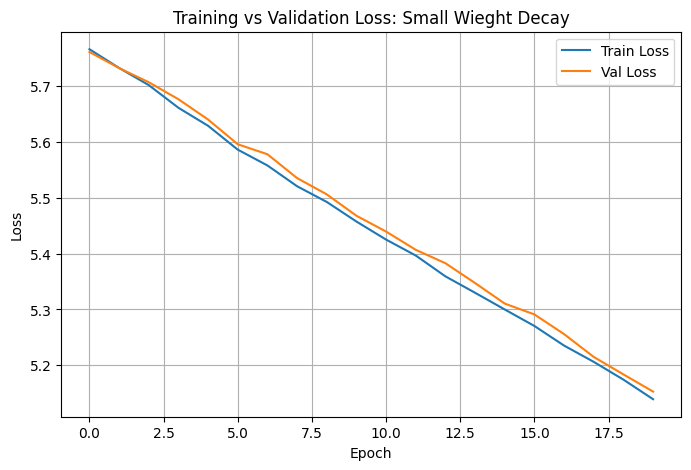

In [ ]:
plt.figure(figsize=(8, 5))
plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Val Loss")

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss: Small Wieght Decay")
plt.legend()
plt.grid(True)
plt.show()

##### **BLEU Comparison: Pretrained, Fine-tuned, Improvment**

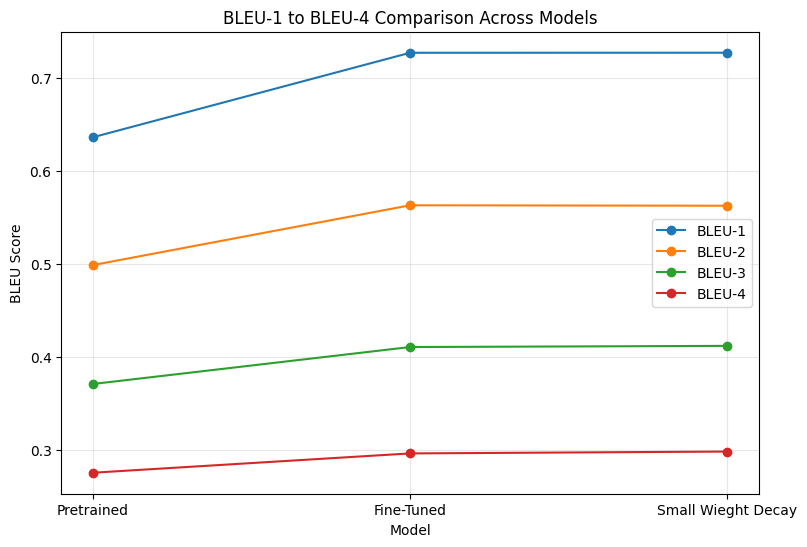

In [ ]:
models = ["Pretrained", "Fine-Tuned", "Small Wieght Decay"]

b1_pre = 0.6366
b2_pre = 0.4989
b3_pre = 0.3708
b4_pre = 0.2752

b1_finetune = 0.7276
b2_finetune = 0.5633
b3_finetune = 0.4106
b4_finetune = 0.2960

bleu1 = [b1_pre, b1_finetune, b1_s]
bleu2 = [b2_pre, b2_finetune, b2_s]
bleu3 = [b3_pre, b3_finetune, b3_s]
bleu4 = [b4_pre, b4_finetune, b4_s]

plt.figure(figsize=(9,6))
plt.plot(models, bleu1, marker="o", label="BLEU-1")
plt.plot(models, bleu2, marker="o", label="BLEU-2")
plt.plot(models, bleu3, marker="o", label="BLEU-3")
plt.plot(models, bleu4, marker="o", label="BLEU-4")

plt.xlabel("Model")
plt.ylabel("BLEU Score")
plt.title("BLEU-1 to BLEU-4 Comparison Across Models")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

#### Second Experiment:
- Big weight decay value: 0.05

In [ ]:
import os
from google.colab import drive

drive.mount('/content/drive')

model_wd_small = BlipForConditionalGeneration.from_pretrained(
    "Salesforce/blip-image-captioning-base"
).to(device)

baseline_path = "/content/drive/MyDrive/DeepLearning/Final_blip_baseline_model.pth"
model_wd_small.load_state_dict(torch.load(baseline_path, map_location=device))

print("✓ Baseline fine-tuned weights loaded")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✓ Baseline fine-tuned weights loaded


In [ ]:
# Freaze all layers execpt LM Head
for p in model_wd_small.parameters():
    p.requires_grad = False

for name, p in model_wd_small.named_parameters():
    if "lm_head" in name or "text_decoder.cls" in name:
        p.requires_grad = True

print("✓ LM Head unfrozen")


✓ LM Head unfrozen


In [ ]:
# Data Loaders

MAX_LENGTH = 50
BATCH_SIZE = 4

train_dataset = CaptionDataset(train_df, processor, max_length=MAX_LENGTH)
val_dataset   = CaptionDataset(val_df, processor, max_length=MAX_LENGTH)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader   = DataLoader(val_dataset, batch_size=BATCH_SIZE)

print("Train loader size:", len(train_loader))
print("Val loader size:", len(val_loader))


Train loader size: 1750
Val loader size: 375


In [ ]:
optimizer = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, model_wd_small.parameters()),
    lr=1e-5,
    weight_decay=0.05   # Big WD
)

In [ ]:
CHECKPOINT_DIR = "/content/drive/MyDrive/DeepLearning/wd_005_checkpoints"
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

print("Checkpoint directory:", CHECKPOINT_DIR)


Checkpoint directory: /content/drive/MyDrive/DeepLearning/wd_005_checkpoints


In [ ]:
EPOCHS = 20
train_losses = []
val_losses = []

for epoch in range(EPOCHS):
    # -------- Training --------
    model_wd_small.train()
    total_train_loss = 0

    for batch in train_loader:
        batch = {k: v.to(device) for k, v in batch.items()}

        outputs = model_wd_small(**batch, labels=batch["input_ids"])
        loss = outputs.loss

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_train_loss += loss.item()

    avg_train_loss = total_train_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    # -------- Validation --------
    model_wd_small.eval()
    total_val_loss = 0

    with torch.no_grad():
        for batch in val_loader:
            batch = {k: v.to(device) for k, v in batch.items()}
            outputs = model_wd_small(**batch, labels=batch["input_ids"])
            total_val_loss += outputs.loss.item()

    avg_val_loss = total_val_loss / len(val_loader)
    val_losses.append(avg_val_loss)

    print(
        f"Epoch {epoch+1}/{EPOCHS} | "
        f"Train Loss: {avg_train_loss:.4f} | "
        f"Val Loss: {avg_val_loss:.4f}"
    )

    # -------- Save checkpoint --------
    ckpt_path = f"{CHECKPOINT_DIR}/epoch_{epoch+1}.pth"
    torch.save(model_wd_small.state_dict(), ckpt_path)
    print(f"💾 Saved: {ckpt_path}")


Epoch 1/20 | Train Loss: 5.7303 | Val Loss: 5.7440
💾 Saved: /content/drive/MyDrive/DeepLearning/wd_005_checkpoints/epoch_1.pth
Epoch 2/20 | Train Loss: 5.6991 | Val Loss: 5.7011
💾 Saved: /content/drive/MyDrive/DeepLearning/wd_005_checkpoints/epoch_2.pth
Epoch 3/20 | Train Loss: 5.6657 | Val Loss: 5.6734
💾 Saved: /content/drive/MyDrive/DeepLearning/wd_005_checkpoints/epoch_3.pth
Epoch 4/20 | Train Loss: 5.6318 | Val Loss: 5.6404
💾 Saved: /content/drive/MyDrive/DeepLearning/wd_005_checkpoints/epoch_4.pth
Epoch 5/20 | Train Loss: 5.5983 | Val Loss: 5.5983
💾 Saved: /content/drive/MyDrive/DeepLearning/wd_005_checkpoints/epoch_5.pth
Epoch 6/20 | Train Loss: 5.5648 | Val Loss: 5.5617
💾 Saved: /content/drive/MyDrive/DeepLearning/wd_005_checkpoints/epoch_6.pth
Epoch 7/20 | Train Loss: 5.5324 | Val Loss: 5.5398
💾 Saved: /content/drive/MyDrive/DeepLearning/wd_005_checkpoints/epoch_7.pth
Epoch 8/20 | Train Loss: 5.5019 | Val Loss: 5.5084
💾 Saved: /content/drive/MyDrive/DeepLearning/wd_005_checkpoi

In [ ]:
torch.save(
    model_wd_small.state_dict(),
    "/content/drive/MyDrive/DeepLearning/blip_wd_0.05.pth"
)

print("💾 Model saved: weight_decay = 0.05")


💾 Model saved: weight_decay = 0.05


In [ ]:
b1_lwd, b2_lwd, b3_lwd, b4_lwd = evaluate_multi_ref(
    model_wd_small,
    test_df
)

print("\n📊 WD = 0.05 — Test BLEU:")
print(f"BLEU-1: {b1_lwd:.4f}")
print(f"BLEU-2: {b2_lwd:.4f}")
print(f"BLEU-3: {b3_lwd:.4f}")
print(f"BLEU-4: {b4_lwd:.4f}")



📊 WD = 0.05 — Test BLEU:
BLEU-1: 0.7318
BLEU-2: 0.5673
BLEU-3: 0.4152
BLEU-4: 0.2994


##### **Loss Comparison: Big Weight Decay**

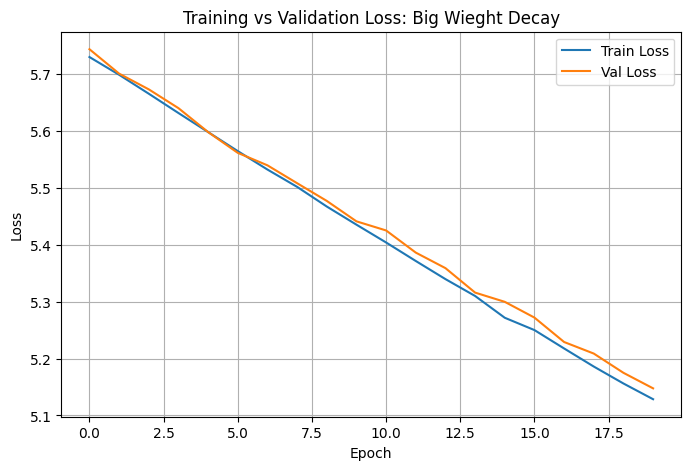

In [ ]:
plt.figure(figsize=(8, 5))
plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Val Loss")

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss: Big Wieght Decay")
plt.legend()
plt.grid(True)
plt.show()

##### **BLEU Comparison: Pretrained, Fine-tuned, Improvment**

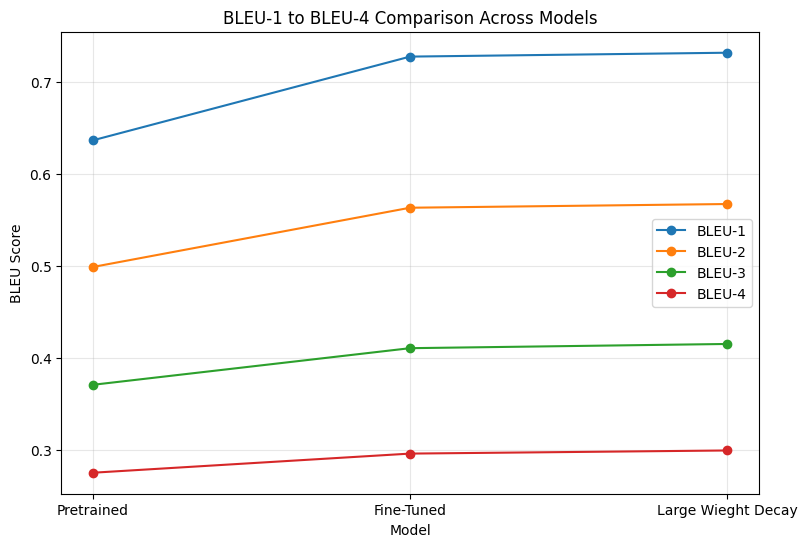

In [ ]:
models = ["Pretrained", "Fine-Tuned", "Large Wieght Decay"]

b1_pre = 0.6366
b2_pre = 0.4989
b3_pre = 0.3708
b4_pre = 0.2752

b1_finetune = 0.7276
b2_finetune = 0.5633
b3_finetune = 0.4106
b4_finetune = 0.2960

bleu1 = [b1_pre, b1_finetune, b1_lwd]
bleu2 = [b2_pre, b2_finetune, b2_lwd]
bleu3 = [b3_pre, b3_finetune, b3_lwd]
bleu4 = [b4_pre, b4_finetune, b4_lwd]

plt.figure(figsize=(9,6))
plt.plot(models, bleu1, marker="o", label="BLEU-1")
plt.plot(models, bleu2, marker="o", label="BLEU-2")
plt.plot(models, bleu3, marker="o", label="BLEU-3")
plt.plot(models, bleu4, marker="o", label="BLEU-4")

plt.xlabel("Model")
plt.ylabel("BLEU Score")
plt.title("BLEU-1 to BLEU-4 Comparison Across Models")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

### **3- Regularization: Dropout**

#### First Experiment:
- Small Dropout value: 0.1

In [ ]:
from transformers import BlipForConditionalGeneration, BlipConfig

# Load config and modify dropout
config = BlipConfig.from_pretrained("Salesforce/blip-image-captioning-base")
config.hidden_dropout_prob = 0.1
config.attention_probs_dropout_prob = 0.1

# Load pretrained BLIP with modified dropout
model_dropout_small = BlipForConditionalGeneration.from_pretrained(
    "Salesforce/blip-image-captioning-base",
    config=config
).to(device)

# Load fine-tuned baseline weights
baseline_path = "/content/drive/MyDrive/DeepLearning/Final_blip_baseline_model.pth"
model_dropout_small.load_state_dict(
    torch.load(baseline_path, map_location=device),
    strict=True
)

print("✓ Baseline fine-tuned weights loaded with large dropout (0.1)")

✓ Baseline fine-tuned weights loaded with large dropout (0.1)


In [ ]:
# Freeze everything
for param in model_dropout_small.parameters():
    param.requires_grad = False

# Unfreeze LM head
for name, param in model_dropout_small.named_parameters():
    if "lm_head" in name or "text_decoder.cls" in name:
        param.requires_grad = True

print("✓ LM Head ready for fine-tuning")


✓ LM Head ready for fine-tuning


In [ ]:
MAX_LENGTH = 50
BATCH_SIZE = 4

train_dataset = CaptionDataset(train_df, processor, max_length=MAX_LENGTH)
val_dataset   = CaptionDataset(val_df, processor, max_length=MAX_LENGTH)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader   = DataLoader(val_dataset, batch_size=BATCH_SIZE)

In [ ]:
LEARNING_RATE = 1e-5
EPOCHS = 20
WEIGHT_DECAY = 0.01  #the same as fine-tuned baseline

optimizer = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, model_dropout_small.parameters()),
    lr=LEARNING_RATE,
    weight_decay=WEIGHT_DECAY
)

In [ ]:
import os
from google.colab import drive
drive.mount('/content/drive')

CHECKPOINT_DIR = "/content/drive/MyDrive/DeepLearning/dropout_small_checkpoints"
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

train_losses, val_losses = [], []

for epoch in range(EPOCHS):
    model_dropout_small.train()
    total_train_loss = 0

    for batch in train_loader:
        batch = {k: v.to(device) for k, v in batch.items()}
        outputs = model_dropout_small(**batch, labels=batch["input_ids"])
        loss = outputs.loss

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_train_loss += loss.item()

    avg_train_loss = total_train_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    # Validation
    model_dropout_small.eval()
    total_val_loss = 0
    with torch.no_grad():
        for batch in val_loader:
            batch = {k: v.to(device) for k, v in batch.items()}
            outputs = model_dropout_small(**batch, labels=batch["input_ids"])
            total_val_loss += outputs.loss.item()

    avg_val_loss = total_val_loss / len(val_loader)
    val_losses.append(avg_val_loss)

    print(f"Epoch {epoch+1}/{EPOCHS} | Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f}")

    # Save checkpoint
    checkpoint_path = f"{CHECKPOINT_DIR}/blip_dropout_small_epoch_{epoch+1}.pth"
    torch.save(model_dropout_small.state_dict(), checkpoint_path)
    print(f"💾 Saved checkpoint: {checkpoint_path}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Epoch 1/20 | Train Loss: 5.7698 | Val Loss: 5.7693
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/dropout_small_checkpoints/blip_dropout_small_epoch_1.pth
Epoch 2/20 | Train Loss: 5.7299 | Val Loss: 5.7259
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/dropout_small_checkpoints/blip_dropout_small_epoch_2.pth
Epoch 3/20 | Train Loss: 5.6916 | Val Loss: 5.6981
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/dropout_small_checkpoints/blip_dropout_small_epoch_3.pth
Epoch 4/20 | Train Loss: 5.6666 | Val Loss: 5.6629
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/dropout_small_checkpoints/blip_dropout_small_epoch_4.pth
Epoch 5/20 | Train Loss: 5.6250 | Val Loss: 5.6432
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/dropout_small_checkpoints/blip_dropout_small_epoch_5.pth
Epoch 6/20 | Train Loss: 5.5965 | Val Loss: 5.5944


In [ ]:
b1_sd, b2_sd, b3_sd, b4_sd = evaluate_multi_ref(model_dropout_small, val_df)
print(f"Validation BLEU Scores - Dropout 0.1:\nBLEU-1: {b1_sd:.4f}, BLEU-2: {b2_sd:.4f}, BLEU-3: {b3_sd:.4f}, BLEU-4: {b4_sd:.4f}")

Validation BLEU Scores - Dropout 0.1:
BLEU-1: 0.7217, BLEU-2: 0.5541, BLEU-3: 0.4028, BLEU-4: 0.2883


##### **Loss Comparison: Small Dropout**

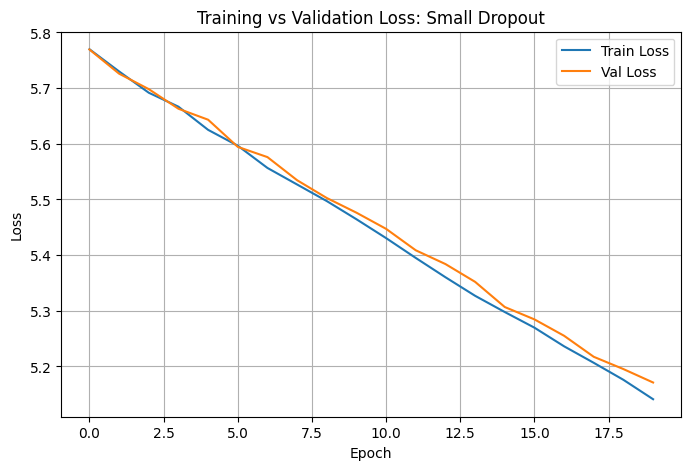

In [ ]:
plt.figure(figsize=(8, 5))
plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Val Loss")

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss: Small Dropout")
plt.legend()
plt.grid(True)
plt.show()

##### **BLEU Comparison: Pretrained, Fine-tuned, Improvment**

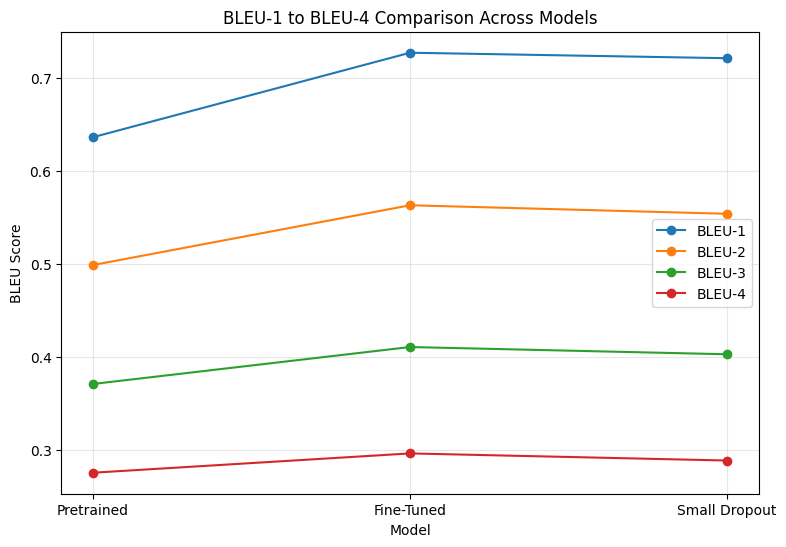

In [ ]:
models = ["Pretrained", "Fine-Tuned", "Small Dropout"]

b1_pre = 0.6366
b2_pre = 0.4989
b3_pre = 0.3708
b4_pre = 0.2752

b1_finetune = 0.7276
b2_finetune = 0.5633
b3_finetune = 0.4106
b4_finetune = 0.2960

bleu1 = [b1_pre, b1_finetune, b1_sd]
bleu2 = [b2_pre, b2_finetune, b2_sd]
bleu3 = [b3_pre, b3_finetune, b3_sd]
bleu4 = [b4_pre, b4_finetune, b4_sd]

plt.figure(figsize=(9,6))
plt.plot(models, bleu1, marker="o", label="BLEU-1")
plt.plot(models, bleu2, marker="o", label="BLEU-2")
plt.plot(models, bleu3, marker="o", label="BLEU-3")
plt.plot(models, bleu4, marker="o", label="BLEU-4")

plt.xlabel("Model")
plt.ylabel("BLEU Score")
plt.title("BLEU-1 to BLEU-4 Comparison Across Models")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

#### Second Experiment:
- Big Dropout value: 0.3

In [ ]:
from transformers import BlipForConditionalGeneration, BlipConfig

# Load config and modify dropout
config = BlipConfig.from_pretrained("Salesforce/blip-image-captioning-base")
config.hidden_dropout_prob = 0.3
config.attention_probs_dropout_prob = 0.3

# Load pretrained BLIP with modified dropout
model_dropout_big = BlipForConditionalGeneration.from_pretrained(
    "Salesforce/blip-image-captioning-base",
    config=config
).to(device)

# Load fine-tuned baseline weights
baseline_path = "/content/drive/MyDrive/DeepLearning/Final_blip_baseline_model.pth"
model_dropout_big.load_state_dict(
    torch.load(baseline_path, map_location=device),
    strict=True
)

print("✓ Baseline fine-tuned weights loaded with large dropout (0.3)")


✓ Baseline fine-tuned weights loaded with large dropout (0.3)


In [ ]:
# Freeze everything
for param in model_dropout_big.parameters():
    param.requires_grad = False

# Unfreeze LM head
for name, param in model_dropout_big.named_parameters():
    if "lm_head" in name or "text_decoder.cls" in name:
        param.requires_grad = True

print("✓ LM Head ready for fine-tuning")


✓ LM Head ready for fine-tuning


In [ ]:
MAX_LENGTH = 50
BATCH_SIZE = 4

train_dataset = CaptionDataset(train_df, processor, max_length=MAX_LENGTH)
val_dataset   = CaptionDataset(val_df, processor, max_length=MAX_LENGTH)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader   = DataLoader(val_dataset, batch_size=BATCH_SIZE)

In [ ]:
LEARNING_RATE = 1e-5
EPOCHS = 20
WEIGHT_DECAY = 0.01  #the same as fine-tuned baseline

optimizer = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, model_dropout_big.parameters()),
    lr=LEARNING_RATE,
    weight_decay=WEIGHT_DECAY
)

In [ ]:
import os
from google.colab import drive
drive.mount('/content/drive')

CHECKPOINT_DIR = "/content/drive/MyDrive/DeepLearning/dropout_big_checkpoints"
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

train_losses, val_losses = [], []

for epoch in range(EPOCHS):
    model_dropout_big.train()
    total_train_loss = 0

    for batch in train_loader:
        batch = {k: v.to(device) for k, v in batch.items()}
        outputs = model_dropout_big(**batch, labels=batch["input_ids"])
        loss = outputs.loss

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_train_loss += loss.item()

    avg_train_loss = total_train_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    # Validation
    model_dropout_big.eval()
    total_val_loss = 0
    with torch.no_grad():
        for batch in val_loader:
            batch = {k: v.to(device) for k, v in batch.items()}
            outputs = model_dropout_big(**batch, labels=batch["input_ids"])
            total_val_loss += outputs.loss.item()

    avg_val_loss = total_val_loss / len(val_loader)
    val_losses.append(avg_val_loss)

    print(f"Epoch {epoch+1}/{EPOCHS} | Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f}")

    # Save checkpoint
    checkpoint_path = f"{CHECKPOINT_DIR}/blip_dropout_big_epoch_{epoch+1}.pth"
    torch.save(model_dropout_big.state_dict(), checkpoint_path)
    print(f"💾 Saved checkpoint: {checkpoint_path}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Epoch 1/20 | Train Loss: 5.7636 | Val Loss: 5.7588
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/dropout_big_checkpoints/blip_dropout_big_epoch_1.pth
Epoch 2/20 | Train Loss: 5.7243 | Val Loss: 5.7337
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/dropout_big_checkpoints/blip_dropout_big_epoch_2.pth
Epoch 3/20 | Train Loss: 5.6904 | Val Loss: 5.7074
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/dropout_big_checkpoints/blip_dropout_big_epoch_3.pth
Epoch 4/20 | Train Loss: 5.6621 | Val Loss: 5.6619
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/dropout_big_checkpoints/blip_dropout_big_epoch_4.pth
Epoch 5/20 | Train Loss: 5.6209 | Val Loss: 5.6199
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/dropout_big_checkpoints/blip_dropout_big_epoch_5.pth
Epoch 6/20 | Train Loss: 5.5896 | Val Loss: 5.6034
💾 Saved checkpoint: 

In [ ]:
b1_ld, b2_ld, b3_ld, b4_ld = evaluate_multi_ref(model_dropout_big, val_df)
print(f"Validation BLEU Scores - Dropout 0.3:\nBLEU-1: {b1_ld:.4f}, BLEU-2: {b2_ld:.4f}, BLEU-3: {b3_ld:.4f}, BLEU-4: {b4_ld:.4f}")

Validation BLEU Scores - Dropout 0.3:
BLEU-1: 0.7242, BLEU-2: 0.5578, BLEU-3: 0.4078, BLEU-4: 0.2956


##### **Loss Comparison: Large Dropout**

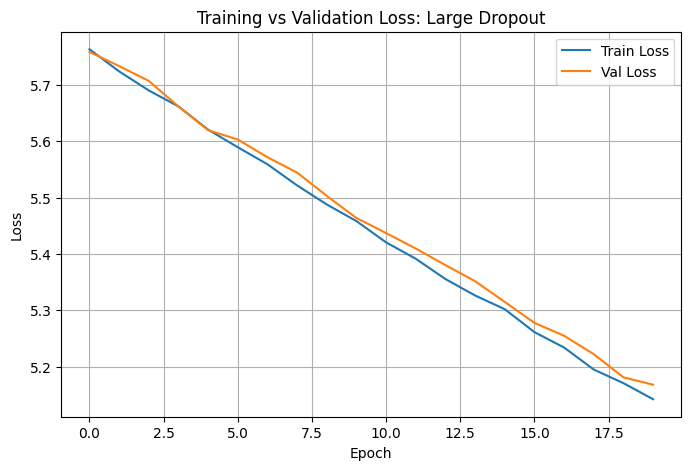

In [ ]:
plt.figure(figsize=(8, 5))
plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Val Loss")

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss: Large Dropout")
plt.legend()
plt.grid(True)
plt.show()

##### **BLEU Comparison: Pretrained, Fine-tuned, Improvment**

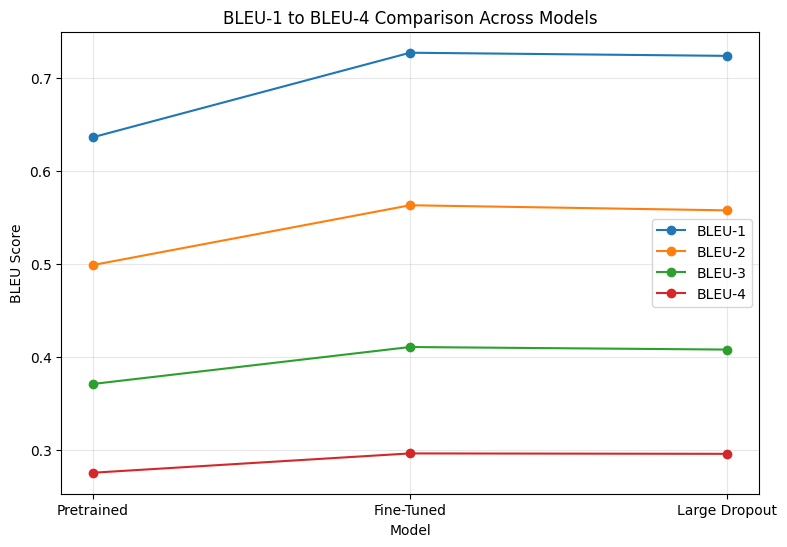

In [ ]:
models = ["Pretrained", "Fine-Tuned", "Large Dropout"]

b1_pre = 0.6366
b2_pre = 0.4989
b3_pre = 0.3708
b4_pre = 0.2752

b1_finetune = 0.7276
b2_finetune = 0.5633
b3_finetune = 0.4106
b4_finetune = 0.2960

bleu1 = [b1_pre, b1_finetune, b1_ld]
bleu2 = [b2_pre, b2_finetune, b2_ld]
bleu3 = [b3_pre, b3_finetune, b3_ld]
bleu4 = [b4_pre, b4_finetune, b4_ld]

plt.figure(figsize=(9,6))
plt.plot(models, bleu1, marker="o", label="BLEU-1")
plt.plot(models, bleu2, marker="o", label="BLEU-2")
plt.plot(models, bleu3, marker="o", label="BLEU-3")
plt.plot(models, bleu4, marker="o", label="BLEU-4")

plt.xlabel("Model")
plt.ylabel("BLEU Score")
plt.title("BLEU-1 to BLEU-4 Comparison Across Models")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

## **LR Scheduler + Warmup Improvment**

In [ ]:
import math
import torch
from transformers import BlipForConditionalGeneration, get_linear_schedule_with_warmup

print("=" * 70)
print("IMPROVEMENT: LR Scheduler + Warmup (Linear Warmup + Decay)")
print("=" * 70)

# -------------------------------------------------
# Load fine-tuned baseline model
# -------------------------------------------------
model_sched = BlipForConditionalGeneration.from_pretrained(
    "Salesforce/blip-image-captioning-base"
).to(device)

baseline_path = "/content/drive/MyDrive/Final_blip_baseline_model.pth"
model_sched.load_state_dict(torch.load(baseline_path, map_location=device))
print("✓ Fine-tuned weights loaded")

# -------------------------------------------------
# Freeze all layers except LM head
# -------------------------------------------------
for p in model_sched.parameters():
    p.requires_grad = False

for name, p in model_sched.named_parameters():
    if "lm_head" in name or "text_decoder.cls" in name:
        p.requires_grad = True

print("✓ LM Head is trainable")

# -------------------------------------------------
# Optimizer
# -------------------------------------------------
optimizer = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, model_sched.parameters()),
    lr=1e-5,
    weight_decay=0.01
)
print("✓ AdamW optimizer initialized")

# -------------------------------------------------
# Scheduler + Warmup
# -------------------------------------------------
MAX_EPOCHS = 20
total_steps = len(train_loader) * MAX_EPOCHS
warmup_ratio = 0.1
warmup_steps = int(total_steps * warmup_ratio)

scheduler = get_linear_schedule_with_warmup(
    optimizer,
    num_warmup_steps=warmup_steps,
    num_training_steps=total_steps
)

print(f"✓ Scheduler initialized | total_steps={total_steps} | warmup_steps={warmup_steps}")

# -------------------------------------------------
# Training + Validation Loop
# -------------------------------------------------
print(f"\nTraining for {MAX_EPOCHS} epochs...\n")

for epoch in range(MAX_EPOCHS):

    # -------- Training --------
    model_sched.train()
    total_train_loss = 0

    for batch in train_loader:
        batch = {k: v.to(device) for k, v in batch.items()}

        outputs = model_sched(**batch, labels=batch["input_ids"])
        loss = outputs.loss

        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model_sched.parameters(), 1.0)
        optimizer.step()
        scheduler.step()   # ✅ update LR each step

        total_train_loss += loss.item()

    avg_train_loss = total_train_loss / len(train_loader)

    # -------- Validation --------
    model_sched.eval()
    total_val_loss = 0

    with torch.no_grad():
        for batch in val_loader:
            batch = {k: v.to(device) for k, v in batch.items()}
            outputs = model_sched(**batch, labels=batch["input_ids"])
            total_val_loss += outputs.loss.item()

    avg_val_loss = total_val_loss / len(val_loader)

    current_lr = scheduler.get_last_lr()[0]
    print(
        f"Epoch {epoch+1}/{MAX_EPOCHS} | "
        f"LR: {current_lr:.8f} | "
        f"Train Loss: {avg_train_loss:.4f} | "
        f"Val Loss: {avg_val_loss:.4f}"
    )

# -------------------------------------------------
# Final Evaluation on TEST SET (Multi-Reference BLEU)
# -------------------------------------------------
print("\n🔍 Final Evaluation on TEST SET (Multi-Reference BLEU)")

b1_sc, b2_sc, b3_sc, b4_sc = evaluate_multi_ref(model_sched, test_df)

print("\n📊 Scheduler+Warmup – Test BLEU Scores:")
print(f"BLEU-1: {b1_sc:.4f}")
print(f"BLEU-2: {b2_sc:.4f}")
print(f"BLEU-3: {b3_sc:.4f}")
print(f"BLEU-4: {b4_sc:.4f}")

IMPROVEMENT: LR Scheduler + Warmup (Linear Warmup + Decay)
✓ Fine-tuned weights loaded
✓ LM Head is trainable
✓ AdamW optimizer initialized
✓ Scheduler initialized | total_steps=35000 | warmup_steps=3500

Training for 20 epochs...

Epoch 1/20 | LR: 0.00000500 | Train Loss: 5.7831 | Val Loss: 5.7871
Epoch 2/20 | LR: 0.00001000 | Train Loss: 5.7606 | Val Loss: 5.7839
Epoch 3/20 | LR: 0.00000944 | Train Loss: 5.7342 | Val Loss: 5.7405
Epoch 4/20 | LR: 0.00000889 | Train Loss: 5.7046 | Val Loss: 5.7059
Epoch 5/20 | LR: 0.00000833 | Train Loss: 5.6666 | Val Loss: 5.6755
Epoch 6/20 | LR: 0.00000778 | Train Loss: 5.6418 | Val Loss: 5.6502
Epoch 7/20 | LR: 0.00000722 | Train Loss: 5.6123 | Val Loss: 5.6218
Epoch 8/20 | LR: 0.00000667 | Train Loss: 5.5919 | Val Loss: 5.6101
Epoch 9/20 | LR: 0.00000611 | Train Loss: 5.5665 | Val Loss: 5.5884
Epoch 10/20 | LR: 0.00000556 | Train Loss: 5.5405 | Val Loss: 5.5782
Epoch 11/20 | LR: 0.00000500 | Train Loss: 5.5278 | Val Loss: 5.5444
Epoch 12/20 | LR: 

### **Performance Comparison**

##### **Loss Comparison**

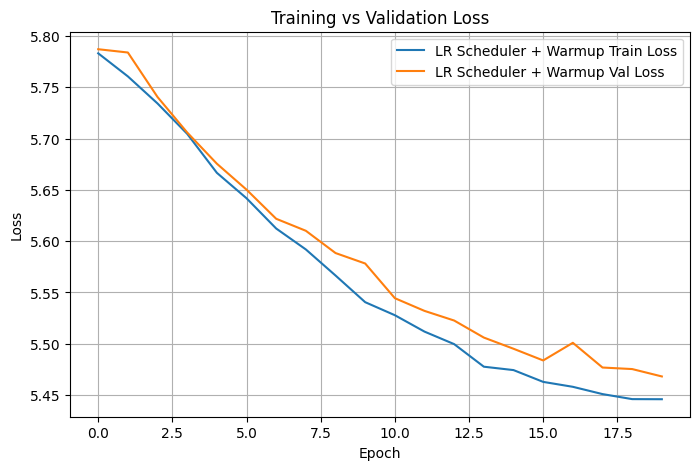

In [ ]:
import matplotlib.pyplot as plt

train_loss_sc = [
    5.7831, 5.7606, 5.7342, 5.7046, 5.6666,
    5.6418, 5.6123, 5.5919, 5.5665, 5.5405,
    5.5278, 5.5118, 5.4996, 5.4776, 5.4743,
    5.4628, 5.4580, 5.4509, 5.4460, 5.4459
]

val_loss_sc = [
    5.7871, 5.7839, 5.7405, 5.7059, 5.6755,
    5.6502, 5.6218, 5.6101, 5.5884, 5.5782,
    5.5444, 5.5320, 5.5226, 5.5060, 5.4951,
    5.4837, 5.5009, 5.4768, 5.4753, 5.4681
]

plt.figure(figsize=(8,5))
plt.plot(train_loss_sc, label="LR Scheduler + Warmup Train Loss")
plt.plot(val_loss_sc, label="LR Scheduler + Warmup Val Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss")
plt.legend()
plt.grid(True)
plt.show()

##### **Output Comparison**

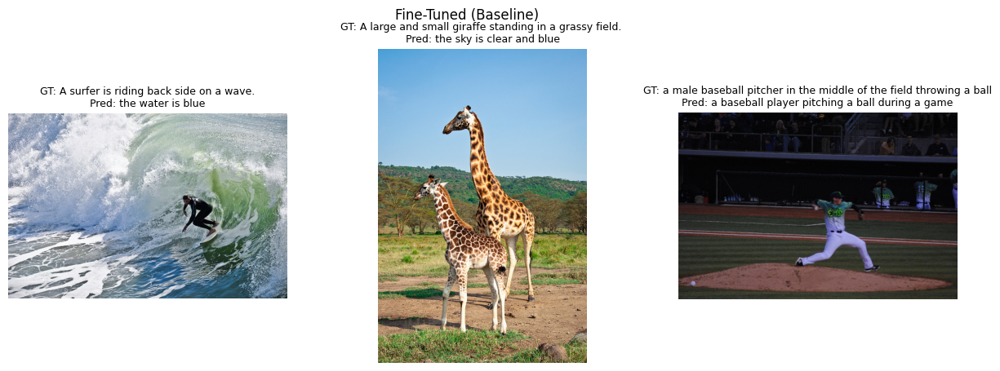

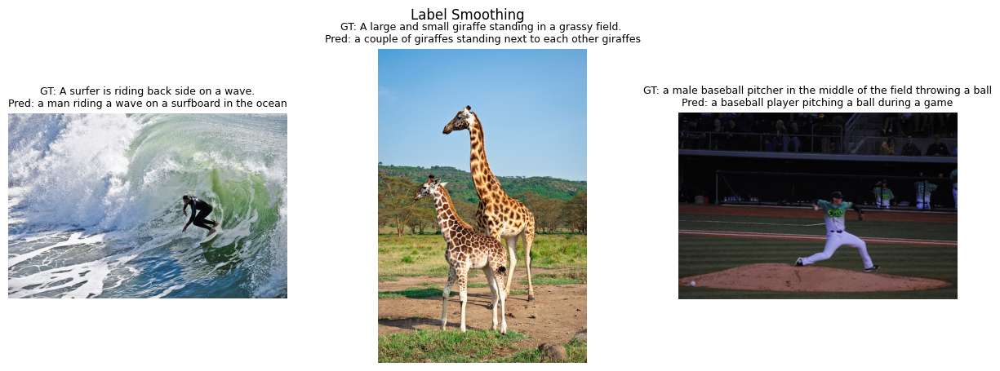

In [ ]:
def show_predictions(model, df, title):
    fig, axes = plt.subplots(1, 3, figsize=(15,5))
    for i in range(3):
        img = df.iloc[i]["image"]
        gt  = df.iloc[i]["captions"][0]
        pred = generate_caption(img, model, processor)

        axes[i].imshow(img)
        axes[i].set_title(f"GT: {gt}\nPred: {pred}", fontsize=9)
        axes[i].axis("off")
    plt.suptitle(title)
    plt.show()

show_predictions(model, test_df, "Fine-Tuned (Baseline)")
show_predictions(model_sched, test_df, "Label Smoothing")

##### **BLEU Comparison: Pretrained, Fine-tuned, Improvment**

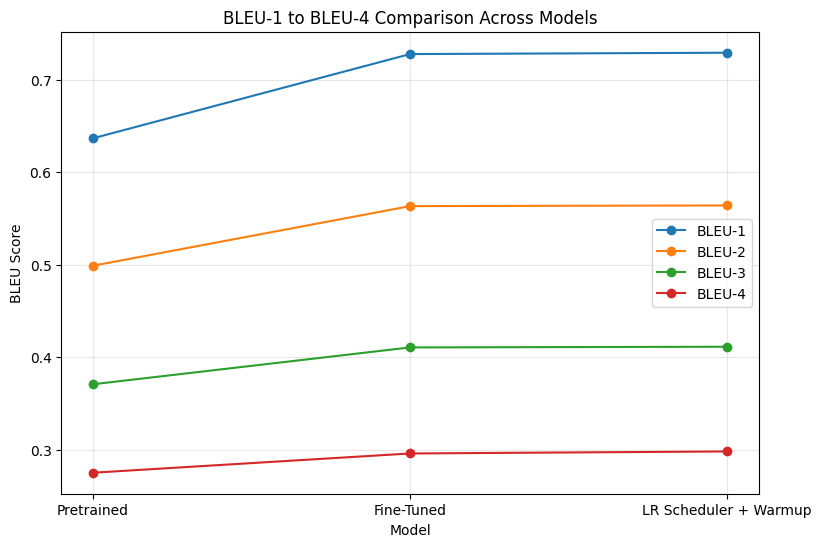

In [ ]:
models = ["Pretrained", "Fine-Tuned", "LR Scheduler + Warmup"]

b1_pre = 0.6366
b2_pre = 0.4989
b3_pre = 0.3708
b4_pre = 0.2752

b1_finetune = 0.7276
b2_finetune = 0.5633
b3_finetune = 0.4106
b4_finetune = 0.2960

bleu1 = [b1_pre, b1_finetune, b1_sc]
bleu2 = [b2_pre, b2_finetune, b2_sc]
bleu3 = [b3_pre, b3_finetune, b3_sc]
bleu4 = [b4_pre, b4_finetune, b4_sc]

plt.figure(figsize=(9,6))
plt.plot(models, bleu1, marker="o", label="BLEU-1")
plt.plot(models, bleu2, marker="o", label="BLEU-2")
plt.plot(models, bleu3, marker="o", label="BLEU-3")
plt.plot(models, bleu4, marker="o", label="BLEU-4")

plt.xlabel("Model")
plt.ylabel("BLEU Score")
plt.title("BLEU-1 to BLEU-4 Comparison Across Models")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

## **Max Length Improvement**

In [ ]:
"""
=================================================================
MAX LENGTH Improvement
=================================================================
We take the Fine-Tuned model and apply different fixed max_length strategies during training.

Each type is trained independently, and then we compare and select the best one.
=================================================================
"""

from google.colab import drive
drive.mount('/content/drive')

# ============================================
# DataLoaders for Max Length Improvements
# ============================================

BATCH_SIZE = 4

def make_loaders(max_len):
  train_loader = DataLoader(
      CaptionDataset(train_df, processor, max_length=max_len),
      batch_size=BATCH_SIZE,
      shuffle=True
  )
  val_loader = DataLoader(
      CaptionDataset(val_df, processor, max_length=max_len),
      batch_size=BATCH_SIZE,
      shuffle=False
  )
  return train_loader, val_loader

def evaluate_multi_ref(model, df, max_length=50, num_beams=3):
    b1, b2, b3, b4 = [], [], [], []

    model.eval()
    for i in range(len(df)):
        image = df.iloc[i]["image"]
        refs  = df.iloc[i]["captions"]

        hyp = generate_caption(
            image, model, processor,
            max_length=max_length,
            num_beams=num_beams
        )

        x1, x2, x3, x4 = compute_bleu_multi_refs(refs, hyp)
        b1.append(x1); b2.append(x2); b3.append(x3); b4.append(x4)

    return np.mean(b1), np.mean(b2), np.mean(b3), np.mean(b4)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Trains and evaluates the fine-tuned BLIP model using a fixed maximum caption length.

def train_one_maxlen(max_len, tag, weights_path, epochs=20, patience=3):
    print("=" * 70)
    print(f"{tag}: Fixed Max Length = {max_len} (on Fine-Tuned Model)")
    print("=" * 70)

    # -------------------------------------------------
    # Create DataLoaders with the specified max_length
    # -------------------------------------------------
    train_loader, val_loader = make_loaders(max_len)
    print("DataLoaders created")
    print("Train loader:", len(train_loader))
    print("Val loader:", len(val_loader))

    # Load BLIP model
    model = BlipForConditionalGeneration.from_pretrained(
        "Salesforce/blip-image-captioning-base"
    ).to(device)

    # Load fine-tuned weights
    model.load_state_dict(torch.load(weights_path, map_location=device))
    print("Fine-tuned weights loaded")

    # Freeze all parameters
    for p in model.parameters():
        p.requires_grad = False

    # Unfreeze only LM head
    for name, p in model.named_parameters():
        if "lm_head" in name or "text_decoder.cls" in name:
            p.requires_grad = True
    print("Trainable layers: lm_head + text_decoder.cls")

    # Optimizer
    optimizer = torch.optim.AdamW(
        filter(lambda p: p.requires_grad, model.parameters()),
        lr=1e-5,
        weight_decay=0.01
    )
    print("AdamW optimizer initialized")

    train_loss = []
    val_loss   = []

    best_val_loss = float("inf")
    patience_counter = 0
    best_model_state = None

    print(f"\n Training with Fixed Max Length = {max_len}...\n")

    for epoch in range(epochs):
        # ---- Train ----
        model.train()
        total_train = 0

        for batch in train_loader:
            batch = {k: v.to(device) for k, v in batch.items()}
            outputs = model(**batch, labels=batch["input_ids"])
            loss = outputs.loss

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_train += loss.item()

        avg_train = total_train / len(train_loader)
        train_loss.append(avg_train)

        # ---- Val ----
        model.eval()
        total_val = 0
        with torch.no_grad():
            for batch in val_loader:
                batch = {k: v.to(device) for k, v in batch.items()}
                outputs = model(**batch, labels=batch["input_ids"])
                total_val += outputs.loss.item()

        avg_val = total_val / len(val_loader)
        val_loss.append(avg_val)

        print(f"Epoch {epoch+1}/{epochs} | Train Loss: {avg_train:.4f} | Val Loss: {avg_val:.4f}")

        # ---- Early stopping ----
        if avg_val < best_val_loss:
            best_val_loss = avg_val
            best_model_state = model.state_dict()
            patience_counter = 0
            print("  -> New best validation loss")
        else:
            patience_counter += 1
            print(f"  -> No improvement ({patience_counter}/{patience})")
            if patience_counter >= patience:
                print("  -> Early stopping triggered")
                break

    # load best
    model.load_state_dict(best_model_state)

    print(f"\n Evaluating Fixed Max Length = {max_len} on TEST SET...")
    b1, b2, b3, b4 = evaluate_multi_ref(model, test_df, max_length=max_len, num_beams=3)

    print(f"\n {tag} (MaxLen={max_len}) — Test BLEU Scores:")
    print(f"BLEU-1: {b1:.4f}")
    print(f"BLEU-2: {b2:.4f}")
    print(f"BLEU-3: {b3:.4f}")
    print(f"BLEU-4: {b4:.4f}")

    return model, train_loss, val_loss, (b1, b2, b3, b4)

### **First Experiment: 100**

In [ ]:
# ============================================
# STEP 1: Run Improvement 1: 100
# ============================================
WEIGHTS_PATH = "/content/drive/MyDrive/DeepLearning/Final_blip_baseline_model.pth"

model_t1, train_loss_t1, val_loss_t1, bleu_t1 = train_one_maxlen(
    max_len=100, tag="Improvement 1", weights_path=WEIGHTS_PATH
)

Improvement 1: Fixed Max Length = 100 (on Fine-Tuned Model)
DataLoaders created
Train loader: 1750
Val loader: 375
Fine-tuned weights loaded
Trainable layers: lm_head + text_decoder.cls
AdamW optimizer initialized

 Training with Fixed Max Length = 100...

Epoch 1/20 | Train Loss: 6.3923 | Val Loss: 6.3774
  -> New best validation loss
Epoch 2/20 | Train Loss: 6.3527 | Val Loss: 6.3399
  -> New best validation loss
Epoch 3/20 | Train Loss: 6.3085 | Val Loss: 6.3031
  -> New best validation loss
Epoch 4/20 | Train Loss: 6.2679 | Val Loss: 6.2599
  -> New best validation loss
Epoch 5/20 | Train Loss: 6.2279 | Val Loss: 6.2209
  -> New best validation loss
Epoch 6/20 | Train Loss: 6.1875 | Val Loss: 6.1749
  -> New best validation loss
Epoch 7/20 | Train Loss: 6.1492 | Val Loss: 6.1329
  -> New best validation loss
Epoch 8/20 | Train Loss: 6.1100 | Val Loss: 6.1008
  -> New best validation loss
Epoch 9/20 | Train Loss: 6.0661 | Val Loss: 6.0636
  -> New best validation loss
Epoch 10/20 | 

### **Second Experiment: 200**

In [ ]:
# ============================================
# STEP 2: Run Improvement 2: 200
# ============================================
model_t2, train_loss_t2, val_loss_t2, bleu_t2 = train_one_maxlen(
    max_len=200, tag="Improvement 2", weights_path=WEIGHTS_PATH
)

Improvement 2: Fixed Max Length = 200 (on Fine-Tuned Model)
DataLoaders created
Train loader: 1750
Val loader: 375
Fine-tuned weights loaded
Trainable layers: lm_head + text_decoder.cls
AdamW optimizer initialized

 Training with Fixed Max Length = 200...

Epoch 1/20 | Train Loss: 6.6995 | Val Loss: 6.6784
  -> New best validation loss
Epoch 2/20 | Train Loss: 6.6516 | Val Loss: 6.6365
  -> New best validation loss
Epoch 3/20 | Train Loss: 6.6051 | Val Loss: 6.5865
  -> New best validation loss
Epoch 4/20 | Train Loss: 6.5616 | Val Loss: 6.5454
  -> New best validation loss
Epoch 5/20 | Train Loss: 6.5140 | Val Loss: 6.5027
  -> New best validation loss
Epoch 6/20 | Train Loss: 6.4719 | Val Loss: 6.4563
  -> New best validation loss
Epoch 7/20 | Train Loss: 6.4292 | Val Loss: 6.4156
  -> New best validation loss
Epoch 8/20 | Train Loss: 6.3842 | Val Loss: 6.3708
  -> New best validation loss
Epoch 9/20 | Train Loss: 6.3425 | Val Loss: 6.3280
  -> New best validation loss
Epoch 10/20 | 

### **Third Experiment: 30**

In [ ]:
# ============================================
# Improvement 3: Data-driven suggestion for max_length
# ============================================
def compute_caption_token_lengths(df, processor):
    """
    Returns an array of token lengths for the FIRST reference caption of each row.
    Uses BLIP tokenizer (processor.tokenizer).
    """
    lengths = []
    for i in tqdm(range(len(df)), desc="Computing caption token lengths"):
        cap = df.iloc[i]["captions"][0]
        ids = processor.tokenizer(
            cap,
            truncation=False,
            add_special_tokens=True
        )["input_ids"]
        lengths.append(len(ids))
    return np.array(lengths)

def suggest_max_length(lengths, percentile=95, pad_to_multiple=10, min_len=30, max_cap=200):
    """
    Suggest a max_length based on a chosen percentile of caption lengths.
    Example: percentile=95 means cover 95% captions without truncation.
    pad_to_multiple rounds up to a clean number (like 10 or 16).
    """
    raw = int(np.percentile(lengths, percentile))
    suggested = max(min_len, raw)

    # round up to a clean multiple (for readability)
    if pad_to_multiple and pad_to_multiple > 1:
        suggested = int(np.ceil(suggested / pad_to_multiple) * pad_to_multiple)

    # cap to avoid extremely large values
    suggested = min(suggested, max_cap)
    return suggested

def truncation_rate(lengths, max_len):
    """Percent of captions that would be truncated if max_len is used."""
    return float(np.mean(lengths > max_len) * 100)

# Compute lengths on TRAIN set
lengths = compute_caption_token_lengths(train_df, processor)

print("\nCaption length summary (tokens):")
print("Mean   :", np.mean(lengths))
print("Median :", np.median(lengths))
print("P90    :", np.percentile(lengths, 90))
print("P95    :", np.percentile(lengths, 95))
print("P99    :", np.percentile(lengths, 99))
print("Max    :", np.max(lengths))

AUTO_MAXLEN = suggest_max_length(lengths, percentile=95, pad_to_multiple=10, min_len=30, max_cap=200)

print(f"\nSuggested max_length (P95 rounded): {AUTO_MAXLEN}")
print(f"Truncation @100: {truncation_rate(lengths, 100):.2f}%")
print(f"Truncation @200: {truncation_rate(lengths, 200):.2f}%")
print(f"Truncation @{AUTO_MAXLEN}: {truncation_rate(lengths, AUTO_MAXLEN):.2f}%")

Computing caption token lengths: 100%|██████████| 7000/7000 [00:01<00:00, 4636.71it/s]


Caption length summary (tokens):
Mean   : 13.843571428571428
Median : 13.0
P90    : 17.0
P95    : 18.0
P99    : 23.0
Max    : 49

Suggested max_length (P95 rounded): 30
Truncation @100: 0.00%
Truncation @200: 0.00%
Truncation @30: 0.10%


In [ ]:
# ============================================
# STEP 3: Run Improvement 3 using AUTO_MAXLEN
# ============================================
model_t3, train_loss_t3, val_loss_t3, bleu_t3 = train_one_maxlen(
    max_len=AUTO_MAXLEN, tag="Improvement 3", weights_path=WEIGHTS_PATH
)

Improvement 3: Fixed Max Length = 30 (on Fine-Tuned Model)
DataLoaders created
Train loader: 1750
Val loader: 375
Fine-tuned weights loaded
Trainable layers: lm_head + text_decoder.cls
AdamW optimizer initialized

 Training with Fixed Max Length = 30...

Epoch 1/20 | Train Loss: 4.9115 | Val Loss: 4.9296
  -> New best validation loss
Epoch 2/20 | Train Loss: 4.8858 | Val Loss: 4.9276
  -> New best validation loss
Epoch 3/20 | Train Loss: 4.8415 | Val Loss: 4.8779
  -> New best validation loss
Epoch 4/20 | Train Loss: 4.8261 | Val Loss: 4.8320
  -> New best validation loss
Epoch 5/20 | Train Loss: 4.8059 | Val Loss: 4.8457
  -> No improvement (1/3)
Epoch 6/20 | Train Loss: 4.7631 | Val Loss: 4.7708
  -> New best validation loss
Epoch 7/20 | Train Loss: 4.7414 | Val Loss: 4.7623
  -> New best validation loss
Epoch 8/20 | Train Loss: 4.7221 | Val Loss: 4.7607
  -> New best validation loss
Epoch 9/20 | Train Loss: 4.6904 | Val Loss: 4.7269
  -> New best validation loss
Epoch 10/20 | Train 

#### **Performance Comparison**

##### **Loss Comparison**

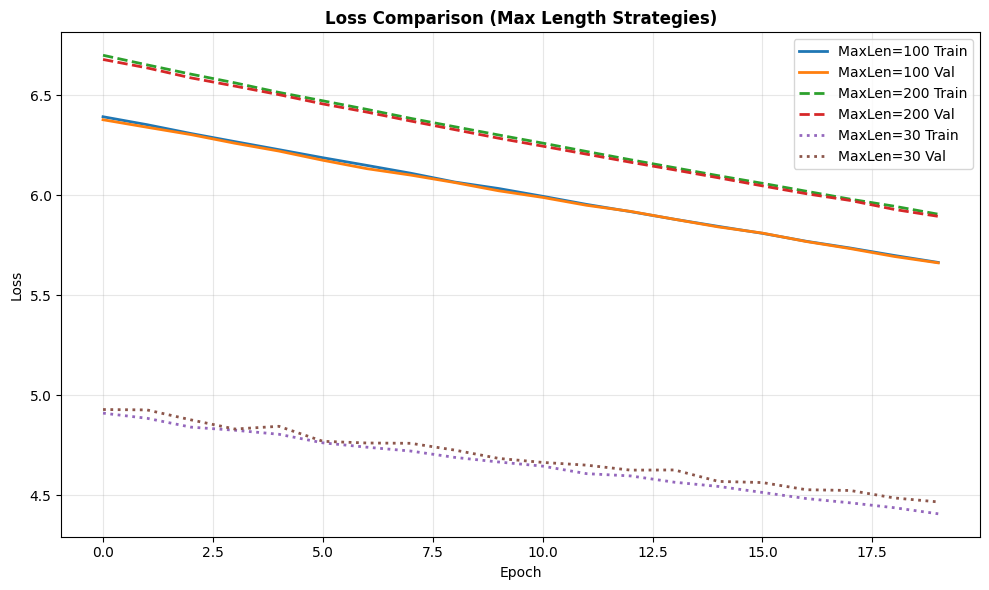

In [ ]:
# ============================================
# COMPARISON PLOTS (Loss)
# ============================================
plt.figure(figsize=(10, 6))
plt.plot(train_loss_t1, label="MaxLen=100 Train", linewidth=2)
plt.plot(val_loss_t1,   label="MaxLen=100 Val",   linewidth=2)

plt.plot(train_loss_t2, label="MaxLen=200 Train", linewidth=2, linestyle="--")
plt.plot(val_loss_t2,   label="MaxLen=200 Val",   linewidth=2, linestyle="--")

plt.plot(train_loss_t3, label=f"MaxLen={AUTO_MAXLEN} Train", linewidth=2, linestyle=":")
plt.plot(val_loss_t3,   label=f"MaxLen={AUTO_MAXLEN} Val",   linewidth=2, linestyle=":")

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Loss Comparison (Max Length Strategies)", fontweight="bold")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

##### **Output Comparison**

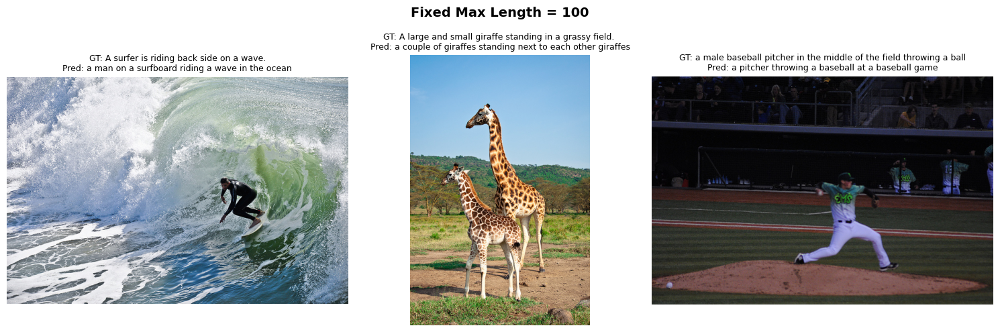

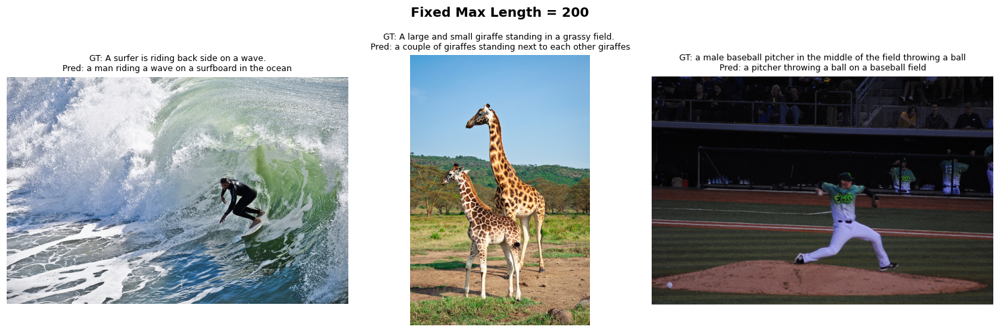

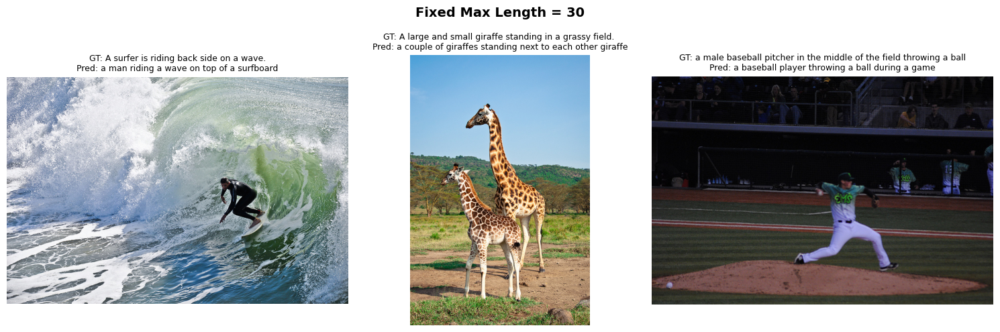

In [ ]:
# ============================================
# Optional: Show predictions
# ============================================
def show_predictions(model, df, title, max_len):
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    for i in range(3):
        img = df.iloc[i]["image"]
        gt  = df.iloc[i]["captions"][0]
        pred = generate_caption(img, model, processor, max_length=max_len, num_beams=3)

        axes[i].imshow(img)
        axes[i].set_title(f"GT: {gt}\nPred: {pred}", fontsize=9)
        axes[i].axis("off")

    plt.suptitle(title, fontsize=14, fontweight="bold")
    plt.tight_layout()
    plt.show()

show_predictions(model_t1, test_df, "Fixed Max Length = 100", max_len=100)
show_predictions(model_t2, test_df, "Fixed Max Length = 200", max_len=200)
show_predictions(model_t3, test_df, f"Fixed Max Length = {AUTO_MAXLEN}", max_len=AUTO_MAXLEN)

##### **BLEU Comparison**

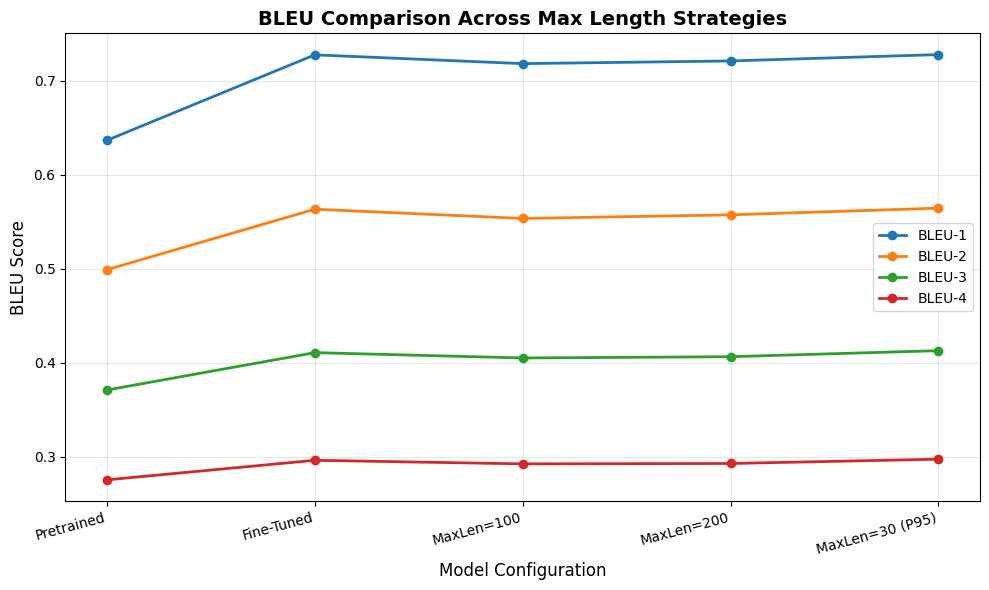

In [ ]:
# -------------------------------------------------
# 3. BLEU Scores Comparison (Pretrained vs Fine-Tuned vs Max Length)
# -------------------------------------------------

models = [
    "Pretrained",
    "Fine-Tuned",
    "MaxLen=100",
    "MaxLen=200",
    f"MaxLen={AUTO_MAXLEN} (P95)"
]

# Pretrained BLIP
b1_pre, b2_pre, b3_pre, b4_pre = 0.6366, 0.4989, 0.3708, 0.2752

# Fine-tuned BLIP
b1_finetune, b2_finetune, b3_finetune, b4_finetune = 0.7276, 0.5633, 0.4106, 0.2960

# Extract BLEU scores from improvements
b1_t1, b2_t1, b3_t1, b4_t1 = bleu_t1
b1_t2, b2_t2, b3_t2, b4_t2 = bleu_t2
b1_t3, b2_t3, b3_t3, b4_t3 = bleu_t3

# Organize BLEU values
bleu1 = [b1_pre, b1_finetune, b1_t1, b1_t2, b1_t3]
bleu2 = [b2_pre, b2_finetune, b2_t1, b2_t2, b2_t3]
bleu3 = [b3_pre, b3_finetune, b3_t1, b3_t2, b3_t3]
bleu4 = [b4_pre, b4_finetune, b4_t1, b4_t2, b4_t3]

# Plot
plt.figure(figsize=(10, 6))
plt.plot(models, bleu1, marker="o", label="BLEU-1", linewidth=2)
plt.plot(models, bleu2, marker="o", label="BLEU-2", linewidth=2)
plt.plot(models, bleu3, marker="o", label="BLEU-3", linewidth=2)
plt.plot(models, bleu4, marker="o", label="BLEU-4", linewidth=2)

plt.xlabel("Model Configuration", fontsize=12)
plt.ylabel("BLEU Score", fontsize=12)
plt.title("BLEU Comparison Across Max Length Strategies", fontsize=14, fontweight="bold")
plt.xticks(rotation=15, ha="right")
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


##  **Learning Rate Decay**

###**1- Learning Rate Decay: Step Decay**

#### First Experiment:
- Step Size: 5

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
model_wd_small = BlipForConditionalGeneration.from_pretrained(
    "Salesforce/blip-image-captioning-base"
).to(device)

baseline_path = "/content/drive/MyDrive/DeepLearning/Final_blip_baseline_model.pth"
model_wd_small.load_state_dict(
    torch.load(baseline_path, map_location=device)
)

<All keys matched successfully>

In [ ]:
import os

CKPT_DIR = "/content/drive/MyDrive/DeepLearning/learning_rate_decay_checkpoints"
os.makedirs(CKPT_DIR, exist_ok=True)

print("Checkpoint directory ready:", CKPT_DIR)

Checkpoint directory ready: /content/drive/MyDrive/DeepLearning/learning_rate_decay_checkpoints


In [ ]:
# Freeze all layers
for p in model_wd_small.parameters():
    p.requires_grad = False

# Unfreeze only LM Head
for name, p in model_wd_small.named_parameters():
    if "lm_head" in name or "text_decoder.cls" in name:
        p.requires_grad = True

print("LM Head unfrozen")

LM Head unfrozen


In [ ]:
LEARNING_RATE = 1e-5
EPOCHS = 20
GAMMA = 0.5
STEP_SIZE = 5

print("LR:", LEARNING_RATE)
print("Epochs:", EPOCHS)
print("Gamma:", GAMMA)
print("Step size:", STEP_SIZE)

LR: 1e-05
Epochs: 20
Gamma: 0.5
Step size: 5


In [ ]:
optimizer = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, model_wd_small.parameters()),
    lr=LEARNING_RATE,
    weight_decay=0.01
)

print("AdamW optimizer initialized")

AdamW optimizer initialized


In [ ]:
from torch.optim.lr_scheduler import StepLR

scheduler = StepLR(
    optimizer,
    step_size=STEP_SIZE,
    gamma=GAMMA
)

print("StepLR scheduler initialized")

StepLR scheduler initialized


In [ ]:
train_losses = []
val_losses = []

print("\nStarting Step Decay Training with Checkpoints...\n")

for epoch in range(EPOCHS):

    # -------- Training --------
    model_wd_small.train()
    total_train_loss = 0

    for batch in train_loader:
        batch = {k: v.to(device) for k, v in batch.items()}

        outputs = model_wd_small(**batch, labels=batch["input_ids"])
        loss = outputs.loss

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_train_loss += loss.item()

    avg_train_loss = total_train_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    # -------- Validation --------
    model_wd_small.eval()
    total_val_loss = 0

    with torch.no_grad():
        for batch in val_loader:
            batch = {k: v.to(device) for k, v in batch.items()}
            outputs = model_wd_small(**batch, labels=batch["input_ids"])
            total_val_loss += outputs.loss.item()

    avg_val_loss = total_val_loss / len(val_loader)
    val_losses.append(avg_val_loss)

    # -------- Step Decay --------
    scheduler.step()
    current_lr = scheduler.get_last_lr()[0]

    print(
        f"Epoch {epoch+1}/{EPOCHS} | "
        f"Train: {avg_train_loss:.4f} | "
        f"Val: {avg_val_loss:.4f} | "
        f"LR: {current_lr:.6f}"
    )

    # -------- Save Checkpoint --------
    ckpt_path = os.path.join(
        CKPT_DIR,
        f"step_decay_checkpoint_epoch_{epoch+1}.pth"
    )

    torch.save({
        "epoch": epoch + 1,
        "model_state_dict": model_wd_small.state_dict(),
        "optimizer_state_dict": optimizer.state_dict(),
        "scheduler_state_dict": scheduler.state_dict(),
        "train_loss": avg_train_loss,
        "val_loss": avg_val_loss,
        "learning_rate": current_lr
    }, ckpt_path)

    print(f"💾 Saved Step Decay checkpoint: {ckpt_path}")


Starting Step Decay Training with Checkpoints...

Epoch 1/20 | Train: 5.7631 | Val: 5.7694 | LR: 0.000010
💾 Saved Step Decay checkpoint: /content/drive/MyDrive/DeepLearning/learning_rate_decay_checkpoints/step_decay_checkpoint_epoch_1.pth
Epoch 2/20 | Train: 5.7328 | Val: 5.7224 | LR: 0.000010
💾 Saved Step Decay checkpoint: /content/drive/MyDrive/DeepLearning/learning_rate_decay_checkpoints/step_decay_checkpoint_epoch_2.pth
Epoch 3/20 | Train: 5.6908 | Val: 5.7045 | LR: 0.000010
💾 Saved Step Decay checkpoint: /content/drive/MyDrive/DeepLearning/learning_rate_decay_checkpoints/step_decay_checkpoint_epoch_3.pth
Epoch 4/20 | Train: 5.6654 | Val: 5.6664 | LR: 0.000010
💾 Saved Step Decay checkpoint: /content/drive/MyDrive/DeepLearning/learning_rate_decay_checkpoints/step_decay_checkpoint_epoch_4.pth
Epoch 5/20 | Train: 5.6300 | Val: 5.6376 | LR: 0.000005
💾 Saved Step Decay checkpoint: /content/drive/MyDrive/DeepLearning/learning_rate_decay_checkpoints/step_decay_checkpoint_epoch_5.pth
Epoc

In [ ]:
# ============================================
# Evaluation: Step Decay Fine-Tuned Model
# ============================================

model_wd_small.eval()

print("=" * 70)
print("STEP DECAY FINE-TUNED BLIP (TEST SET, Multi-Reference BLEU)")
print("=" * 70)

b1_sd, b2_sd, b3_sd, b4_sd = evaluate_multi_ref(
    model_wd_small,
    test_df
)

print("\n📊 Step Decay Fine-Tuned BLIP – Test BLEU Scores:")
print(f"BLEU-1: {b1_sd:.4f}")
print(f"BLEU-2: {b2_sd:.4f}")
print(f"BLEU-3: {b3_sd:.4f}")
print(f"BLEU-4: {b4_sd:.4f}")

STEP DECAY FINE-TUNED BLIP (TEST SET, Multi-Reference BLEU)

📊 Step Decay Fine-Tuned BLIP – Test BLEU Scores:
BLEU-1: 0.7220
BLEU-2: 0.5585
BLEU-3: 0.4086
BLEU-4: 0.2952


##### **BLEU Comparison**

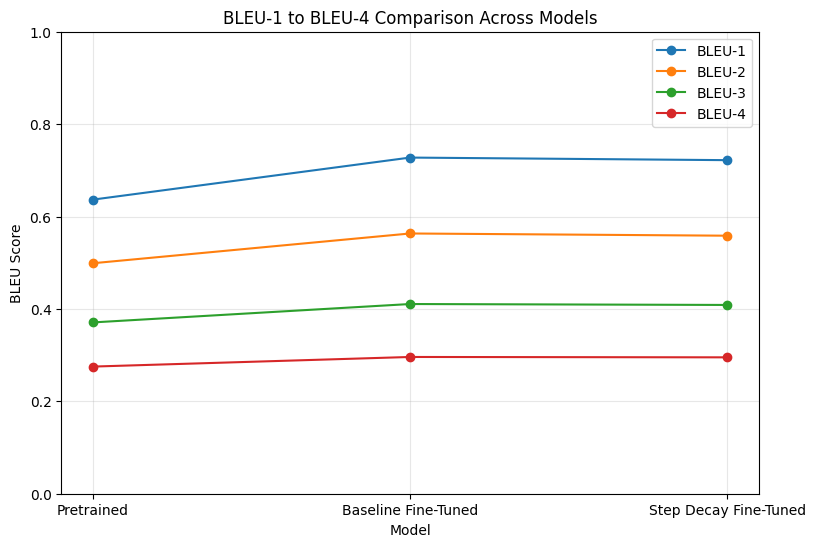

In [ ]:
# ================= BLEU Comparison Plot =================

models = ["Pretrained", "Baseline Fine-Tuned", "Step Decay Fine-Tuned"]

# Pretrained BLIP
b1_pre, b2_pre, b3_pre, b4_pre = 0.6366, 0.4989, 0.3708, 0.2752

# Baseline Fine-Tuned
b1_base, b2_base, b3_base, b4_base = 0.7276, 0.5633, 0.4106, 0.2960

# Step Decay Fine-Tuned
b1_step, b2_step, b3_step, b4_step = 0.7220, 0.5585, 0.4086, 0.2952

bleu1 = [b1_pre, b1_base, b1_step]
bleu2 = [b2_pre, b2_base, b2_step]
bleu3 = [b3_pre, b3_base, b3_step]
bleu4 = [b4_pre, b4_base, b4_step]

plt.figure(figsize=(9, 6))
plt.plot(models, bleu1, marker="o", label="BLEU-1")
plt.plot(models, bleu2, marker="o", label="BLEU-2")
plt.plot(models, bleu3, marker="o", label="BLEU-3")
plt.plot(models, bleu4, marker="o", label="BLEU-4")

plt.xlabel("Model")
plt.ylabel("BLEU Score")
plt.title("BLEU-1 to BLEU-4 Comparison Across Models")
plt.legend()
plt.grid(True, alpha=0.3)
plt.ylim(0, 1)
plt.show()

##### **Loss Comparison**

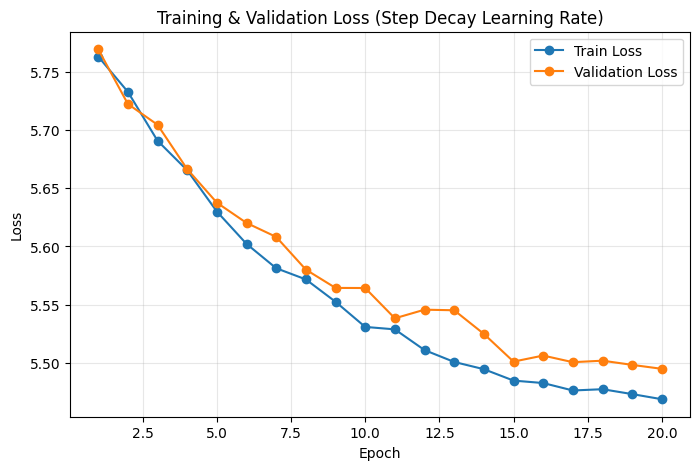

In [ ]:
# NOTE:
# Due to an accident in the notebook, training and validation losses
# were not saved programmatically during training.
# The following loss values were manually reconstructed from the
# epoch-wise training logs printed during training.

epochs = list(range(1, 21))

train_losses = [
    5.7631, 5.7328, 5.6908, 5.6654, 5.6300,
    5.6022, 5.5813, 5.5717, 5.5525, 5.5309,
    5.5288, 5.5110, 5.5008, 5.4946, 5.4848,
    5.4827, 5.4763, 5.4774, 5.4732, 5.4688
]

val_losses = [
    5.7694, 5.7224, 5.7045, 5.6664, 5.6376,
    5.6202, 5.6082, 5.5801, 5.5644, 5.5643,
    5.5383, 5.5457, 5.5452, 5.5249, 5.5011,
    5.5063, 5.5006, 5.5019, 5.4983, 5.4949
]

plt.figure(figsize=(8,5))
plt.plot(epochs, train_losses, marker='o', label="Train Loss")
plt.plot(epochs, val_losses, marker='o', label="Validation Loss")

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training & Validation Loss (Step Decay Learning Rate)")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

#### Second Experiment:
- Step Size: 3

In [ ]:
model_wd_small = BlipForConditionalGeneration.from_pretrained(
    "Salesforce/blip-image-captioning-base"
).to(device)

baseline_path = "/content/drive/MyDrive/DeepLearning/Final_blip_baseline_model.pth"
model_wd_small.load_state_dict(
    torch.load(baseline_path, map_location=device)
)

<All keys matched successfully>

In [ ]:
import os

CKPT_DIR = "/content/drive/MyDrive/DeepLearning/learning_rate_decay_checkpoints"
os.makedirs(CKPT_DIR, exist_ok=True)

print("Checkpoint directory ready:", CKPT_DIR)

Checkpoint directory ready: /content/drive/MyDrive/DeepLearning/learning_rate_decay_checkpoints


In [ ]:
# Freeze all layers
for p in model_wd_small.parameters():
    p.requires_grad = False

# Unfreeze only LM Head
for name, p in model_wd_small.named_parameters():
    if "lm_head" in name or "text_decoder.cls" in name:
        p.requires_grad = True

print("LM Head unfrozen")

LM Head unfrozen


In [ ]:
LEARNING_RATE = 1e-5
EPOCHS = 20
GAMMA = 0.5
STEP_SIZE = 3

print("LR:", LEARNING_RATE)
print("Epochs:", EPOCHS)
print("Gamma:", GAMMA)
print("Step size:", STEP_SIZE)

LR: 1e-05
Epochs: 20
Gamma: 0.5
Step size: 3


In [ ]:
optimizer = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, model_wd_small.parameters()),
    lr=LEARNING_RATE,
    weight_decay=0.01
)

print("AdamW optimizer initialized")

AdamW optimizer initialized


In [ ]:
from torch.optim.lr_scheduler import StepLR

scheduler = StepLR(
    optimizer,
    step_size=STEP_SIZE,
    gamma=GAMMA
)

print("StepLR scheduler initialized")

StepLR scheduler initialized


In [ ]:
train_losses = []
val_losses = []

print("\nStarting Step Decay Training with Checkpoints...\n")

for epoch in range(EPOCHS):

    # -------- Training --------
    model_wd_small.train()
    total_train_loss = 0

    for batch in train_loader:
        batch = {k: v.to(device) for k, v in batch.items()}

        outputs = model_wd_small(**batch, labels=batch["input_ids"])
        loss = outputs.loss

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_train_loss += loss.item()

    avg_train_loss = total_train_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    # -------- Validation --------
    model_wd_small.eval()
    total_val_loss = 0

    with torch.no_grad():
        for batch in val_loader:
            batch = {k: v.to(device) for k, v in batch.items()}
            outputs = model_wd_small(**batch, labels=batch["input_ids"])
            total_val_loss += outputs.loss.item()

    avg_val_loss = total_val_loss / len(val_loader)
    val_losses.append(avg_val_loss)

    # -------- Step Decay --------
    scheduler.step()
    current_lr = scheduler.get_last_lr()[0]

    print(
        f"Epoch {epoch+1}/{EPOCHS} | "
        f"Train: {avg_train_loss:.4f} | "
        f"Val: {avg_val_loss:.4f} | "
        f"LR: {current_lr:.6f}"
    )

    # -------- Save Checkpoint --------
    ckpt_path = os.path.join(
        CKPT_DIR,
        f"step_decay_checkpoint_epoch_{epoch+1}.pth"
    )

    torch.save({
        "epoch": epoch + 1,
        "model_state_dict": model_wd_small.state_dict(),
        "optimizer_state_dict": optimizer.state_dict(),
        "scheduler_state_dict": scheduler.state_dict(),
        "train_loss": avg_train_loss,
        "val_loss": avg_val_loss,
        "learning_rate": current_lr
    }, ckpt_path)

    print(f"💾 Saved Step Decay checkpoint: {ckpt_path}")


Starting Step Decay Training with Checkpoints...

Epoch 1/20 | Train: 5.7641 | Val: 5.7660 | LR: 0.000010
💾 Saved Step Decay checkpoint: /content/drive/MyDrive/DeepLearning/learning_rate_decay_checkpoints/step_decay_checkpoint_epoch_1.pth
Epoch 2/20 | Train: 5.7299 | Val: 5.7341 | LR: 0.000010
💾 Saved Step Decay checkpoint: /content/drive/MyDrive/DeepLearning/learning_rate_decay_checkpoints/step_decay_checkpoint_epoch_2.pth
Epoch 3/20 | Train: 5.7004 | Val: 5.7056 | LR: 0.000005
💾 Saved Step Decay checkpoint: /content/drive/MyDrive/DeepLearning/learning_rate_decay_checkpoints/step_decay_checkpoint_epoch_3.pth
Epoch 4/20 | Train: 5.6714 | Val: 5.6799 | LR: 0.000005
💾 Saved Step Decay checkpoint: /content/drive/MyDrive/DeepLearning/learning_rate_decay_checkpoints/step_decay_checkpoint_epoch_4.pth
Epoch 5/20 | Train: 5.6526 | Val: 5.6676 | LR: 0.000005
💾 Saved Step Decay checkpoint: /content/drive/MyDrive/DeepLearning/learning_rate_decay_checkpoints/step_decay_checkpoint_epoch_5.pth
Epoc

In [ ]:
# ============================================
# Evaluation: Step Decay Fine-Tuned Model
# ============================================

model_wd_small.eval()

print("=" * 70)
print("STEP DECAY FINE-TUNED BLIP (TEST SET, Multi-Reference BLEU)")
print("=" * 70)

b1_sd, b2_sd, b3_sd, b4_sd = evaluate_multi_ref(
    model_wd_small,
    test_df
)

print("\n📊 Step Decay Fine-Tuned BLIP – Test BLEU Scores:")
print(f"BLEU-1: {b1_sd:.4f}")
print(f"BLEU-2: {b2_sd:.4f}")
print(f"BLEU-3: {b3_sd:.4f}")
print(f"BLEU-4: {b4_sd:.4f}")

STEP DECAY FINE-TUNED BLIP (TEST SET, Multi-Reference BLEU)

📊 Step Decay Fine-Tuned BLIP – Test BLEU Scores:
BLEU-1: 0.7285
BLEU-2: 0.5658
BLEU-3: 0.4147
BLEU-4: 0.3010


##### **BLEU Comparison**

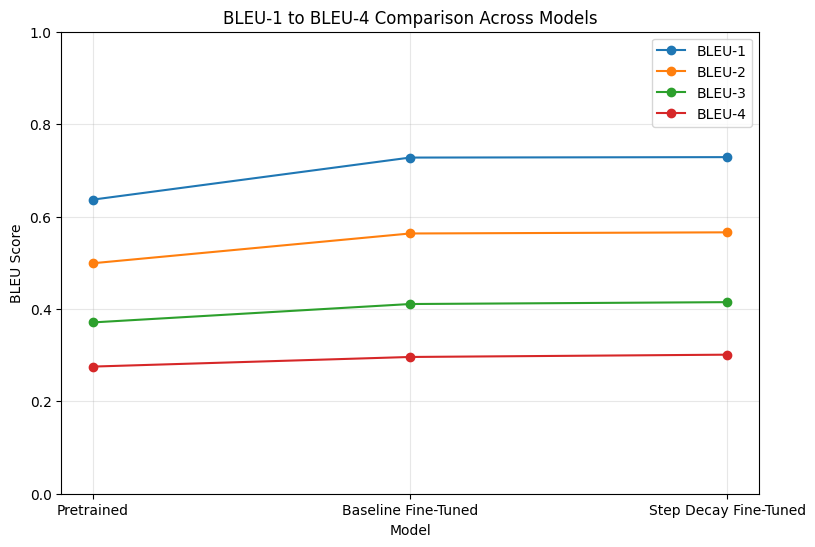

In [ ]:
# ================= BLEU Comparison Plot =================

models = ["Pretrained", "Baseline Fine-Tuned", "Step Decay Fine-Tuned"]

# Pretrained BLIP
b1_pre, b2_pre, b3_pre, b4_pre = 0.6366, 0.4989, 0.3708, 0.2752

# Baseline Fine-Tuned
b1_base, b2_base, b3_base, b4_base = 0.7276, 0.5633, 0.4106, 0.2960


bleu1 = [b1_pre, b1_base, b1_sd]
bleu2 = [b2_pre, b2_base, b2_sd]
bleu3 = [b3_pre, b3_base, b3_sd]
bleu4 = [b4_pre, b4_base, b4_sd]

plt.figure(figsize=(9, 6))
plt.plot(models, bleu1, marker="o", label="BLEU-1")
plt.plot(models, bleu2, marker="o", label="BLEU-2")
plt.plot(models, bleu3, marker="o", label="BLEU-3")
plt.plot(models, bleu4, marker="o", label="BLEU-4")

plt.xlabel("Model")
plt.ylabel("BLEU Score")
plt.title("BLEU-1 to BLEU-4 Comparison Across Models")
plt.legend()
plt.grid(True, alpha=0.3)
plt.ylim(0, 1)
plt.show()

##### **Loss Comparison**

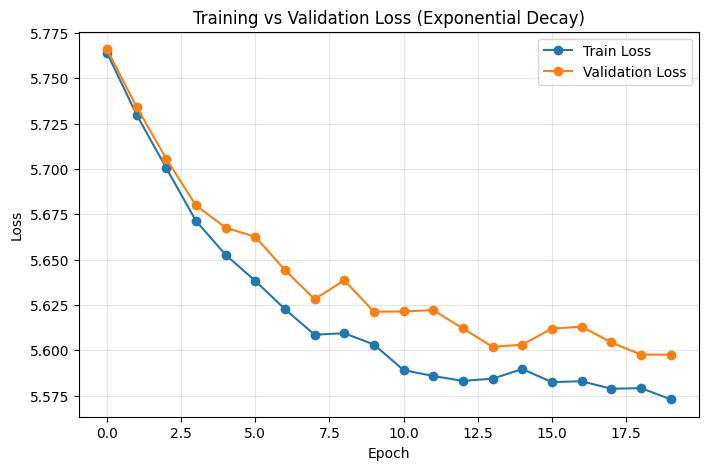

In [ ]:
plt.figure(figsize=(8,5))

plt.plot(train_losses, label="Train Loss", marker="o")
plt.plot(val_losses, label="Validation Loss", marker="o")

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss (Exponential Decay)")
plt.legend()
plt.grid(True, alpha=0.3)

plt.show()

###**2- Learning Rate Decay: Exponential Decay**

#### First Experiment:
- Gamma value: 0.95

In [ ]:
model_exp = BlipForConditionalGeneration.from_pretrained(
    "Salesforce/blip-image-captioning-base"
).to(device)

baseline_path = "/content/drive/MyDrive/DeepLearning/Final_blip_baseline_model.pth"
model_exp.load_state_dict(torch.load(baseline_path, map_location=device))

print("Baseline fine-tuned model loaded for Exponential Decay")


Baseline fine-tuned model loaded for Exponential Decay


In [ ]:
for p in model_exp.parameters():
    p.requires_grad = False

for name, p in model_exp.named_parameters():
    if "lm_head" in name or "text_decoder.cls" in name:
        p.requires_grad = True

print("LM Head unfrozen")

LM Head unfrozen


In [ ]:
LEARNING_RATE = 1e-5
EPOCHS = 20
GAMMA = 0.95

optimizer = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, model_exp.parameters()),
    lr=LEARNING_RATE,
    weight_decay=0.01
)

scheduler = torch.optim.lr_scheduler.ExponentialLR(
    optimizer,
    gamma=GAMMA
)

print("LR:", LEARNING_RATE)
print("Epochs:", EPOCHS)
print("Gamma:", GAMMA)

LR: 1e-05
Epochs: 20
Gamma: 0.95


In [ ]:
train_losses_exp = []
val_losses_exp = []

EXP_CHECKPOINT_DIR = "/content/drive/MyDrive/DeepLearning/learning_rate_decay_checkpoints/exponential_decay"
os.makedirs(EXP_CHECKPOINT_DIR, exist_ok=True)

print("\nStarting Exponential Decay Training...\n")

for epoch in range(EPOCHS):

    # -------- Training --------
    model_exp.train()
    total_train_loss = 0

    for batch in train_loader:
        batch = {k: v.to(device) for k, v in batch.items()}

        outputs = model_exp(**batch, labels=batch["input_ids"])
        loss = outputs.loss

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_train_loss += loss.item()

    avg_train_loss = total_train_loss / len(train_loader)
    train_losses_exp.append(avg_train_loss)

    # -------- Validation --------
    model_exp.eval()
    total_val_loss = 0

    with torch.no_grad():
        for batch in val_loader:
            batch = {k: v.to(device) for k, v in batch.items()}
            outputs = model_exp(**batch, labels=batch["input_ids"])
            total_val_loss += outputs.loss.item()

    avg_val_loss = total_val_loss / len(val_loader)
    val_losses_exp.append(avg_val_loss)

    # -------- Exponential Decay --------
    scheduler.step()
    current_lr = scheduler.get_last_lr()[0]

    print(
        f"Epoch {epoch+1}/{EPOCHS} | "
        f"Train: {avg_train_loss:.4f} | "
        f"Val: {avg_val_loss:.4f} | "
        f"LR: {current_lr:.6f}"
    )

    # -------- Save checkpoint --------
    ckpt_path = f"{EXP_CHECKPOINT_DIR}/exp_decay_epoch_{epoch+1}.pth"
    torch.save(model_exp.state_dict(), ckpt_path)
    print(f"💾 Saved Exponential Decay checkpoint")


Starting Exponential Decay Training...

Epoch 1/20 | Train: 5.7663 | Val: 5.7704 | LR: 0.000010
💾 Saved Exponential Decay checkpoint
Epoch 2/20 | Train: 5.7263 | Val: 5.7417 | LR: 0.000009
💾 Saved Exponential Decay checkpoint
Epoch 3/20 | Train: 5.7005 | Val: 5.7075 | LR: 0.000009
💾 Saved Exponential Decay checkpoint
Epoch 4/20 | Train: 5.6694 | Val: 5.6778 | LR: 0.000008
💾 Saved Exponential Decay checkpoint
Epoch 5/20 | Train: 5.6407 | Val: 5.6573 | LR: 0.000008
💾 Saved Exponential Decay checkpoint
Epoch 6/20 | Train: 5.6160 | Val: 5.6262 | LR: 0.000007
💾 Saved Exponential Decay checkpoint
Epoch 7/20 | Train: 5.5891 | Val: 5.5984 | LR: 0.000007
💾 Saved Exponential Decay checkpoint
Epoch 8/20 | Train: 5.5626 | Val: 5.5781 | LR: 0.000007
💾 Saved Exponential Decay checkpoint
Epoch 9/20 | Train: 5.5433 | Val: 5.5556 | LR: 0.000006
💾 Saved Exponential Decay checkpoint
Epoch 10/20 | Train: 5.5167 | Val: 5.5432 | LR: 0.000006
💾 Saved Exponential Decay checkpoint
Epoch 11/20 | Train: 5.5022 

In [ ]:
b1_exp, b2_exp, b3_exp, b4_exp = evaluate_multi_ref(
    model_exp,
    test_df
)

print("\n📊 Exponential Decay – Test BLEU Scores:")
print(f"BLEU-1: {b1_exp:.4f}")
print(f"BLEU-2: {b2_exp:.4f}")
print(f"BLEU-3: {b3_exp:.4f}")
print(f"BLEU-4: {b4_exp:.4f}")


📊 Exponential Decay – Test BLEU Scores:
BLEU-1: 0.7244
BLEU-2: 0.5588
BLEU-3: 0.4066
BLEU-4: 0.2923


##### **BLEU Comparison**

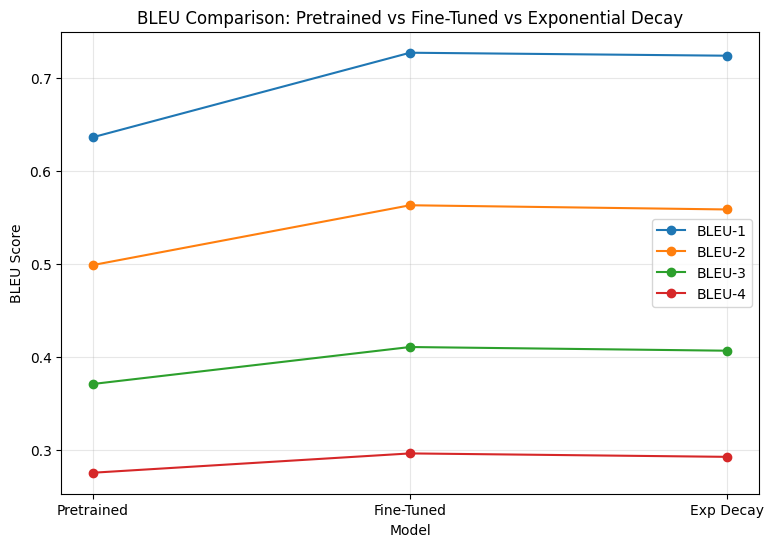

In [ ]:
models = ["Pretrained", "Fine-Tuned", "Exp Decay"]

# Pretrained
b1_pre = 0.6366
b2_pre = 0.4989
b3_pre = 0.3708
b4_pre = 0.2752

# Fine-tuned
b1_ft = 0.7276
b2_ft = 0.5633
b3_ft = 0.4106
b4_ft = 0.2960

# Exponential Decay
b1_exp = b1_exp
b2_exp = b2_exp
b3_exp = b3_exp
b4_exp = b4_exp

bleu1 = [b1_pre, b1_ft, b1_exp]
bleu2 = [b2_pre, b2_ft, b2_exp]
bleu3 = [b3_pre, b3_ft, b3_exp]
bleu4 = [b4_pre, b4_ft, b4_exp]

plt.figure(figsize=(9,6))

plt.plot(models, bleu1, marker="o", label="BLEU-1")
plt.plot(models, bleu2, marker="o", label="BLEU-2")
plt.plot(models, bleu3, marker="o", label="BLEU-3")
plt.plot(models, bleu4, marker="o", label="BLEU-4")

plt.xlabel("Model")
plt.ylabel("BLEU Score")
plt.title("BLEU Comparison: Pretrained vs Fine-Tuned vs Exponential Decay")
plt.legend()
plt.grid(True, alpha=0.3)

plt.show()

##### **Loss Comparison**

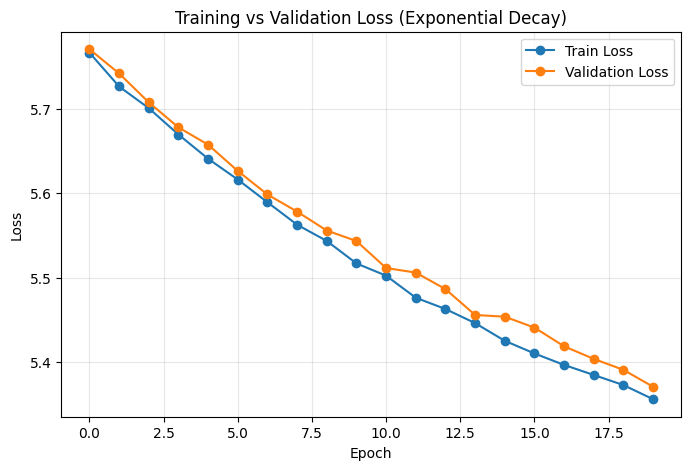

In [ ]:
plt.figure(figsize=(8,5))

plt.plot(train_losses_exp, label="Train Loss", marker="o")
plt.plot(val_losses_exp, label="Validation Loss", marker="o")

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss (Exponential Decay)")
plt.legend()
plt.grid(True, alpha=0.3)

plt.show()

#### Second Experiment:
- Gamma value: 0.90

In [ ]:
model_exp = BlipForConditionalGeneration.from_pretrained(
    "Salesforce/blip-image-captioning-base"
).to(device)

baseline_path = "/content/drive/MyDrive/DeepLearning/Final_blip_baseline_model.pth"
model_exp.load_state_dict(torch.load(baseline_path, map_location=device))

print("Baseline fine-tuned model loaded for Exponential Decay")

Baseline fine-tuned model loaded for Exponential Decay


In [ ]:
for p in model_exp.parameters():
    p.requires_grad = False

for name, p in model_exp.named_parameters():
    if "lm_head" in name or "text_decoder.cls" in name:
        p.requires_grad = True

print("LM Head unfrozen")

LM Head unfrozen


In [ ]:
LEARNING_RATE = 1e-5
EPOCHS = 20
GAMMA = 0.90

optimizer = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, model_exp.parameters()),
    lr=LEARNING_RATE,
    weight_decay=0.01
)

scheduler = torch.optim.lr_scheduler.ExponentialLR(
    optimizer,
    gamma=GAMMA
)

print("LR:", LEARNING_RATE)
print("Epochs:", EPOCHS)
print("Gamma:", GAMMA)

LR: 1e-05
Epochs: 20
Gamma: 0.9


In [ ]:
train_losses_exp = []
val_losses_exp = []

EXP_CHECKPOINT_DIR = "/content/drive/MyDrive/DeepLearning/learning_rate_decay_checkpoints/exponential_decay"
os.makedirs(EXP_CHECKPOINT_DIR, exist_ok=True)

print("\nStarting Exponential Decay Training...\n")

for epoch in range(EPOCHS):

    # -------- Training --------
    model_exp.train()
    total_train_loss = 0

    for batch in train_loader:
        batch = {k: v.to(device) for k, v in batch.items()}

        outputs = model_exp(**batch, labels=batch["input_ids"])
        loss = outputs.loss

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_train_loss += loss.item()

    avg_train_loss = total_train_loss / len(train_loader)
    train_losses_exp.append(avg_train_loss)

    # -------- Validation --------
    model_exp.eval()
    total_val_loss = 0

    with torch.no_grad():
        for batch in val_loader:
            batch = {k: v.to(device) for k, v in batch.items()}
            outputs = model_exp(**batch, labels=batch["input_ids"])
            total_val_loss += outputs.loss.item()

    avg_val_loss = total_val_loss / len(val_loader)
    val_losses_exp.append(avg_val_loss)

    # -------- Exponential Decay --------
    scheduler.step()
    current_lr = scheduler.get_last_lr()[0]

    print(
        f"Epoch {epoch+1}/{EPOCHS} | "
        f"Train: {avg_train_loss:.4f} | "
        f"Val: {avg_val_loss:.4f} | "
        f"LR: {current_lr:.6f}"
    )

    # -------- Save checkpoint --------
    ckpt_path = f"{EXP_CHECKPOINT_DIR}/exp_decay_epoch_{epoch+1}.pth"
    torch.save(model_exp.state_dict(), ckpt_path)
    print(f"💾 Saved Exponential Decay checkpoint")


Starting Exponential Decay Training...

Epoch 1/20 | Train: 5.7617 | Val: 5.7678 | LR: 0.000009
💾 Saved Exponential Decay checkpoint
Epoch 2/20 | Train: 5.7356 | Val: 5.7366 | LR: 0.000008
💾 Saved Exponential Decay checkpoint
Epoch 3/20 | Train: 5.7048 | Val: 5.7208 | LR: 0.000007
💾 Saved Exponential Decay checkpoint
Epoch 4/20 | Train: 5.6716 | Val: 5.6859 | LR: 0.000007
💾 Saved Exponential Decay checkpoint
Epoch 5/20 | Train: 5.6513 | Val: 5.6577 | LR: 0.000006
💾 Saved Exponential Decay checkpoint
Epoch 6/20 | Train: 5.6304 | Val: 5.6478 | LR: 0.000005
💾 Saved Exponential Decay checkpoint
Epoch 7/20 | Train: 5.6150 | Val: 5.6306 | LR: 0.000005
💾 Saved Exponential Decay checkpoint
Epoch 8/20 | Train: 5.5906 | Val: 5.6120 | LR: 0.000004
💾 Saved Exponential Decay checkpoint
Epoch 9/20 | Train: 5.5800 | Val: 5.5878 | LR: 0.000004
💾 Saved Exponential Decay checkpoint
Epoch 10/20 | Train: 5.5639 | Val: 5.5966 | LR: 0.000003
💾 Saved Exponential Decay checkpoint
Epoch 11/20 | Train: 5.5513 

In [ ]:
b1_exp, b2_exp, b3_exp, b4_exp = evaluate_multi_ref(
    model_exp,
    test_df
)

print("\n📊 Exponential Decay – Test BLEU Scores:")
print(f"BLEU-1: {b1_exp:.4f}")
print(f"BLEU-2: {b2_exp:.4f}")
print(f"BLEU-3: {b3_exp:.4f}")
print(f"BLEU-4: {b4_exp:.4f}")


📊 Exponential Decay – Test BLEU Scores:
BLEU-1: 0.7284
BLEU-2: 0.5649
BLEU-3: 0.4126
BLEU-4: 0.2977


##### **BLEU Comparison**

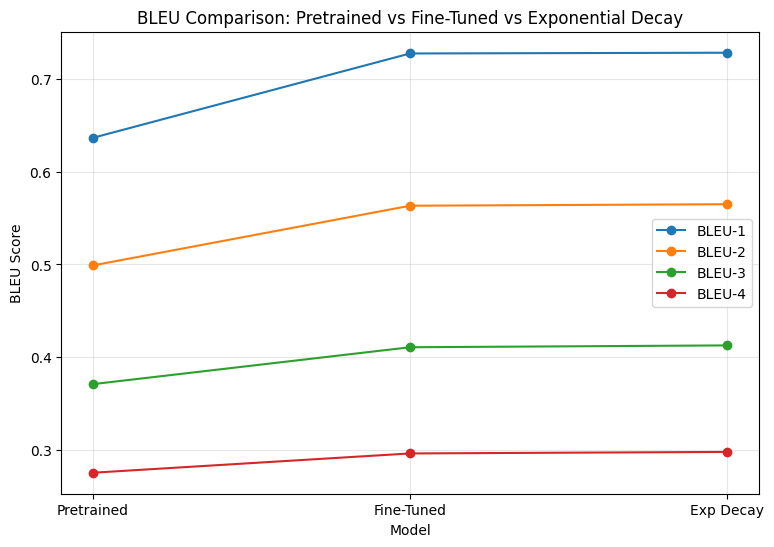

In [ ]:
models = ["Pretrained", "Fine-Tuned", "Exp Decay"]

# Pretrained
b1_pre = 0.6366
b2_pre = 0.4989
b3_pre = 0.3708
b4_pre = 0.2752

# Fine-tuned
b1_ft = 0.7276
b2_ft = 0.5633
b3_ft = 0.4106
b4_ft = 0.2960

# Exponential Decay
b1_exp = b1_exp
b2_exp = b2_exp
b3_exp = b3_exp
b4_exp = b4_exp

bleu1 = [b1_pre, b1_ft, b1_exp]
bleu2 = [b2_pre, b2_ft, b2_exp]
bleu3 = [b3_pre, b3_ft, b3_exp]
bleu4 = [b4_pre, b4_ft, b4_exp]

plt.figure(figsize=(9,6))

plt.plot(models, bleu1, marker="o", label="BLEU-1")
plt.plot(models, bleu2, marker="o", label="BLEU-2")
plt.plot(models, bleu3, marker="o", label="BLEU-3")
plt.plot(models, bleu4, marker="o", label="BLEU-4")

plt.xlabel("Model")
plt.ylabel("BLEU Score")
plt.title("BLEU Comparison: Pretrained vs Fine-Tuned vs Exponential Decay")
plt.legend()
plt.grid(True, alpha=0.3)

plt.show()

##### **Loss Comparison**

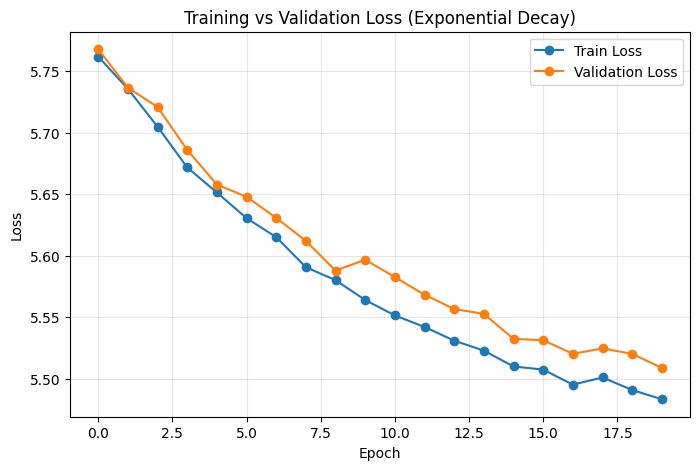

In [ ]:
plt.figure(figsize=(8,5))

plt.plot(train_losses_exp, label="Train Loss", marker="o")
plt.plot(val_losses_exp, label="Validation Loss", marker="o")

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss (Exponential Decay)")
plt.legend()
plt.grid(True, alpha=0.3)

plt.show()

#**Final code with best improvments**

In [ ]:
import os
from google.colab import drive

drive.mount('/content/drive')
model = BlipForConditionalGeneration.from_pretrained(
    "Salesforce/blip-image-captioning-base"
).to(device)

baseline_path = "/content/drive/MyDrive/DeepLearning/Final_blip_baseline_model.pth"
model.load_state_dict(torch.load(baseline_path, map_location=device))

print("✓ Baseline fine-tuned weights loaded")

In [ ]:
for p in model.parameters():
    p.requires_grad = False

for name, p in model.named_parameters():
    if "lm_head" in name or "text_decoder.cls" in name:
        p.requires_grad = True

print("✓ lm_head and text_decoder.cls unfrozen")


✓ lm_head and text_decoder.cls unfrozen


In [ ]:
MAX_LENGTH = 30
BATCH_SIZE = 4

train_dataset = CaptionDataset(train_df, processor, max_length=MAX_LENGTH)
val_dataset   = CaptionDataset(val_df, processor, max_length=MAX_LENGTH)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader   = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)


In [ ]:
import torch.nn as nn
from torch.optim import SGD
from torch.optim.lr_scheduler import StepLR

EPOCHS = 20

criterion = nn.CrossEntropyLoss(
    label_smoothing=0.1,
    ignore_index=processor.tokenizer.pad_token_id
)

optimizer = SGD(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=1e-5,
    momentum=0.9,
    weight_decay=0.05
)

scheduler = StepLR(optimizer, step_size=3, gamma=0.5)


In [ ]:
import os

CHECKPOINT_DIR = "/content/drive/MyDrive/DeepLearning/final_combined_checkpoints"
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

train_losses, val_losses = [], []

for epoch in range(EPOCHS):
    model.train()
    total_train_loss = 0

    for batch in train_loader:
        batch = {k: v.to(device) for k, v in batch.items()}

        outputs = model(
            input_ids=batch["input_ids"],
            attention_mask=batch["attention_mask"],
            pixel_values=batch["pixel_values"]
        )

        logits = outputs.logits
        loss = criterion(
            logits.view(-1, logits.size(-1)),
            batch["input_ids"].view(-1)
        )

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_train_loss += loss.item()

    scheduler.step()

    avg_train_loss = total_train_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    # Validation
    model.eval()
    total_val_loss = 0
    with torch.no_grad():
        for batch in val_loader:
            batch = {k: v.to(device) for k, v in batch.items()}

            outputs = model(
                input_ids=batch["input_ids"],
                attention_mask=batch["attention_mask"],
                pixel_values=batch["pixel_values"]
            )

            logits = outputs.logits
            loss = criterion(
                logits.view(-1, logits.size(-1)),
                batch["input_ids"].view(-1)
            )

            total_val_loss += loss.item()

    avg_val_loss = total_val_loss / len(val_loader)
    val_losses.append(avg_val_loss)

    print(
        f"Epoch {epoch+1}/{EPOCHS} | "
        f"Train Loss: {avg_train_loss:.4f} | "
        f"Val Loss: {avg_val_loss:.4f}"
    )

    checkpoint_path = f"{CHECKPOINT_DIR}/final_model_epoch_{epoch+1}.pth"
    torch.save(model.state_dict(), checkpoint_path)
    print(f"💾 Saved checkpoint: {checkpoint_path}")

Epoch 1/20 | Train Loss: 5.3241 | Val Loss: 5.2294
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/final_combined_checkpoints/final_model_epoch_1.pth
Epoch 2/20 | Train Loss: 5.0808 | Val Loss: 4.9984
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/final_combined_checkpoints/final_model_epoch_2.pth
Epoch 3/20 | Train Loss: 4.8902 | Val Loss: 4.8430
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/final_combined_checkpoints/final_model_epoch_3.pth
Epoch 4/20 | Train Loss: 4.7597 | Val Loss: 4.7718
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/final_combined_checkpoints/final_model_epoch_4.pth
Epoch 5/20 | Train Loss: 4.6887 | Val Loss: 4.6809
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/final_combined_checkpoints/final_model_epoch_5.pth
Epoch 6/20 | Train Loss: 4.6278 | Val Loss: 4.6286
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/final_combined_checkpoints/final_model_epoch_6.pth
Epoch 7/20 | Train Loss: 4.5702 | Val Loss: 4.5944
💾

In [ ]:
# ====== Final BLEU evaluation on TEST set ======
b1_best, b2_best, b3_best, b4_best = evaluate_multi_ref(model, test_df)

print("\n Final Combined Model – Test BLEU Scores:")
print(f"BLEU-1: {b1_best:.4f}")
print(f"BLEU-2: {b2_best:.4f}")
print(f"BLEU-3: {b3_best:.4f}")
print(f"BLEU-4: {b4_best:.4f}")


 Final Combined Model – Test BLEU Scores:
BLEU-1: 0.0910
BLEU-2: 0.0234
BLEU-3: 0.0116
BLEU-4: 0.0078


In [ ]:
import os

CHECKPOINT_DIR = "/content/drive/MyDrive/DeepLearning/final_combined_checkpoints"
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

train_losses, val_losses = [], []

for epoch in range(EPOCHS):
    model.train()
    total_train_loss = 0

    for batch in train_loader:
        batch = {k: v.to(device) for k, v in batch.items()}

        outputs = model(
            input_ids=batch["input_ids"],
            attention_mask=batch["attention_mask"],
            pixel_values=batch["pixel_values"],
            labels=batch["input_ids"]
        )

        loss = outputs.loss
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_train_loss += loss.item()

    scheduler.step()

    avg_train_loss = total_train_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    # Validation
    model.eval()
    total_val_loss = 0
    with torch.no_grad():
        for batch in val_loader:
            batch = {k: v.to(device) for k, v in batch.items()}

            outputs = model(
                input_ids=batch["input_ids"],
                attention_mask=batch["attention_mask"],
                pixel_values=batch["pixel_values"]
            )

            logits = outputs.logits
            loss = criterion(
                logits.view(-1, logits.size(-1)),
                batch["input_ids"].view(-1)
            )

            total_val_loss += loss.item()

    avg_val_loss = total_val_loss / len(val_loader)
    val_losses.append(avg_val_loss)

    print(
        f"Epoch {epoch+1}/{EPOCHS} | "
        f"Train Loss: {avg_train_loss:.4f} | "
        f"Val Loss: {avg_val_loss:.4f}"
    )

    checkpoint_path = f"{CHECKPOINT_DIR}/final_model_epoch_{epoch+1}.pth"
    torch.save(model.state_dict(), checkpoint_path)
    print(f"💾 Saved checkpoint: {checkpoint_path}")

Epoch 1/20 | Train Loss: 6.0287 | Val Loss: 4.4444
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/final_combined_checkpoints/final_model_epoch_1.pth
Epoch 2/20 | Train Loss: 6.0194 | Val Loss: 4.4601
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/final_combined_checkpoints/final_model_epoch_2.pth
Epoch 3/20 | Train Loss: 6.0141 | Val Loss: 4.4531
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/final_combined_checkpoints/final_model_epoch_3.pth
Epoch 4/20 | Train Loss: 6.0118 | Val Loss: 4.4449
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/final_combined_checkpoints/final_model_epoch_4.pth
Epoch 5/20 | Train Loss: 6.0084 | Val Loss: 4.4456
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/final_combined_checkpoints/final_model_epoch_5.pth
Epoch 6/20 | Train Loss: 6.0181 | Val Loss: 4.4580
💾 Saved checkpoint: /content/drive/MyDrive/DeepLearning/final_combined_checkpoints/final_model_epoch_6.pth
Epoch 7/20 | Train Loss: 6.0011 | Val Loss: 4.4513
💾

In [ ]:
# ====== Final BLEU evaluation on TEST set ======
b1_best, b2_best, b3_best, b4_best = evaluate_multi_ref(model, test_df)

print("\n Final Combined Model – Test BLEU Scores:")
print(f"BLEU-1: {b1_best:.4f}")
print(f"BLEU-2: {b2_best:.4f}")
print(f"BLEU-3: {b3_best:.4f}")
print(f"BLEU-4: {b4_best:.4f}")


 Final Combined Model – Test BLEU Scores:
BLEU-1: 0.0919
BLEU-2: 0.0235
BLEU-3: 0.0116
BLEU-4: 0.0079
